In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt
from random import shuffle
import random

In [2]:
import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

torch.manual_seed(34)

In [3]:
# Don't touch these ones!!
FEATURE_SIZE = 6
TAGS_DIM = 3

HIDDEN_DIM = 64
LSTM_LAYERS = 1
EPOCHS = 200

SUBSEQ = False
MIN_SUBSEQ = 100
MAX_SUBSEQ = 10000
REQ_PORCENTAGE = 0.25

LR = 0.01
LR_DECAY = 100

FC_BEFORE = False
FC_DIM = 32

WEIGHTS = False


In [4]:
train_df = pd.read_csv('../input_data/train.csv')
val_df = pd.read_csv('../input_data/valsplit.csv')                       

In [5]:
def prepare_inputs(db):
    chunk_list = []
    
    for chunk in range(db['Chunk_Id'].min(), db['Chunk_Id'].max()+1):                
        db_slice = db[db['Chunk_Id']==chunk]
        data_slice = db_slice.as_matrix()
        tensor_slice = torch.Tensor(data_slice[:,2:-1])        
        chunk_list.append(autograd.Variable(tensor_slice, requires_grad=True).cuda())
                         
    return chunk_list

def prepare_targets(db):
    chunk_list = []
    for chunk in range(db['Chunk_Id'].min(), db['Chunk_Id'].max()+1):        
        db_slice = db[db['Chunk_Id']==chunk]
        data_slice = db_slice.as_matrix()
        tensor_slice = torch.LongTensor(data_slice[:,-1].astype(int))        
        tensor_slice += 1
        chunk_list.append(autograd.Variable(tensor_slice).cuda())

    return chunk_list

inputs = prepare_inputs(train_df)
targets = prepare_targets(train_df)


In [7]:
class LSTMTagger(nn.Module):

    def __init__(self, n_features, hidden_dim, tagset_size, lstm_layers):
        super(LSTMTagger, self).__init__()
        self.hidden_dim = hidden_dim
        self.lstm_layers = lstm_layers

        # The LSTM takes features as inputs, and outputs hidden states
        # with dimensionality hidden_dim.
        if FC_BEFORE:
            self.fc1 = nn.Linear(n_features, FC_DIM)
            self.lstm = nn.LSTM(FC_DIM, hidden_dim, lstm_layers)
        else:
            self.lstm = nn.LSTM(n_features, hidden_dim, lstm_layers)
        

        # The linear layer that maps from hidden state space to tag space
        self.hidden2tag = nn.Linear(hidden_dim, tagset_size)
        self.hidden = self.init_hidden()

    def init_hidden(self):
        # Before we've done anything, we dont have any hidden state.
        # Refer to the Pytorch documentation to see exactly
        # why they have this dimensionality.
        # The axes semantics are (num_layers, minibatch_size, hidden_dim)
        return (autograd.Variable(torch.zeros(self.lstm_layers, 1, self.hidden_dim)).cuda(),
                autograd.Variable(torch.zeros(self.lstm_layers, 1, self.hidden_dim)).cuda())

    def forward(self, input_feats):
        
        if FC_BEFORE: 
            fc_out = self.fc1(input_feats)
            lstm_out, self.hidden = self.lstm(
                fc_out.view(len(fc_out), 1, -1), self.hidden)
            tag_space = self.hidden2tag(lstm_out.view(len(fc_out), -1))
        else:
            lstm_out, self.hidden = self.lstm(
                input_feats.view(len(input_feats), 1, -1), self.hidden)
            tag_space = self.hidden2tag(lstm_out.view(len(input_feats), -1))
        
        tag_scores = F.log_softmax(tag_space)
        
        return tag_scores

In [9]:
def exp_lr_scheduler(optimizer, epoch, init_lr=0.001, lr_decay_epoch=LR_DECAY):
    """Decay learning rate by a factor of 0.1 every lr_decay_epoch epochs."""
    lr = init_lr * (0.1**(epoch // lr_decay_epoch))

    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

    return optimizer

In [10]:
model = LSTMTagger(FEATURE_SIZE, HIDDEN_DIM, TAGS_DIM, LSTM_LAYERS)

model.cuda()
if WEIGHTS:
    weight=torch.Tensor([4,1,4])
    loss_function = nn.NLLLoss(weight.cuda())
else:
    loss_function = nn.NLLLoss()
optimizer = optim.Adam(model.parameters(), lr=LR)

In [11]:
# Validation
model.hidden = model.init_hidden()

val_input = prepare_inputs(val_df)
val_targets = prepare_targets(val_df)

correct_base = -1

def validation(plot=False):
    global correct_base
    model.eval()
    
    total_samples = 0
    correct = 0
    do_base = False
    if correct_base < 0:
        correct_base = 0
        do_base = True

    for sequence, target in list(zip(val_input, val_targets)):
        
        model.hidden = model.init_hidden()

        val_scores = model(sequence)
        val_values, val_indices = val_scores.max(1)

        scores_np = val_scores.cpu().data.numpy()
        indices_np = val_indices.cpu().data.numpy()
        probs = val_values.cpu().data.numpy()

        total_samples += sequence.size()[0]
        correct += (indices_np == target.cpu().data.numpy()).sum()

        if do_base:
            correct_base += (1 == target.cpu().data.numpy()).sum()
        
        if plot:
            t = np.arange(0., probs.size, 1)
            plt.figure()
            plt.plot(t, target.cpu().data.numpy(), t, val_indices.cpu().data.numpy(), t, np.exp(probs))

    return(correct_base/total_samples, correct/total_samples)

base, final = validation()
print("Base", base)
print("Now", final)

Base 0.808574598751
Now 0.808458481705


In [12]:
total_loss = 0
model.eval()

for sequence, target in list(zip(inputs, targets)):
    model.hidden = model.init_hidden()
    tag_scores = model(sequence)
    total_loss += loss_function(tag_scores, target)
print(total_loss)

Variable containing:
 49.8112
[torch.cuda.FloatTensor of size 1 (GPU 0)]



Epoch 0
[ 31.33945084]


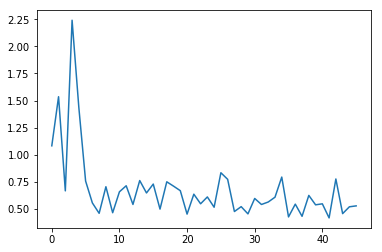

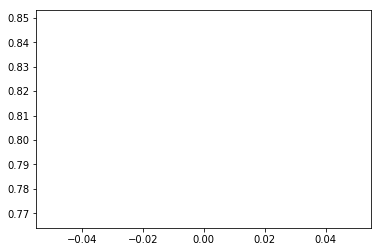

Epoch 1
[ 26.52725601]


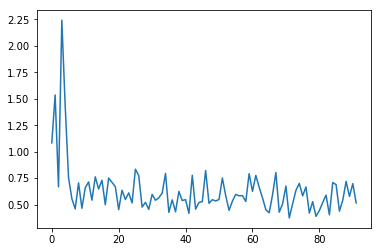

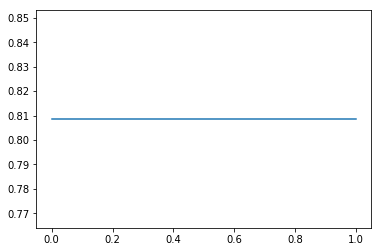

Epoch 2
[ 26.02523613]


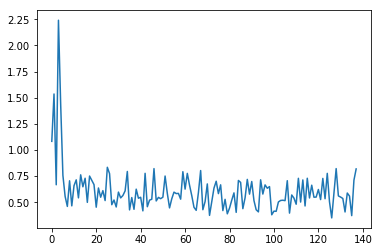

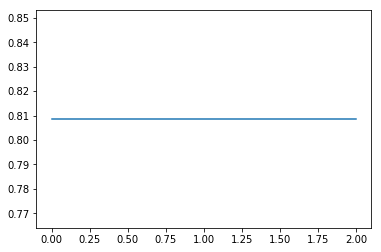

Epoch 3
[ 25.68729591]


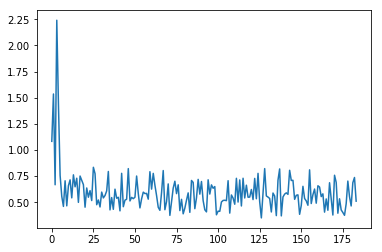

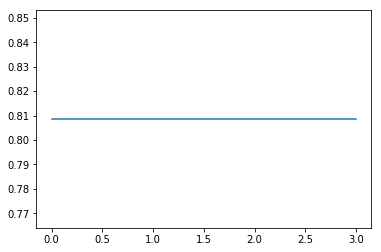

Epoch 4
[ 25.59493065]


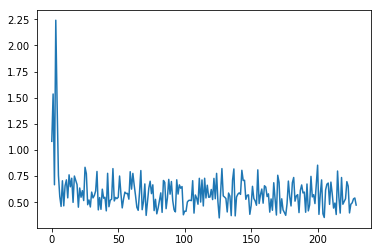

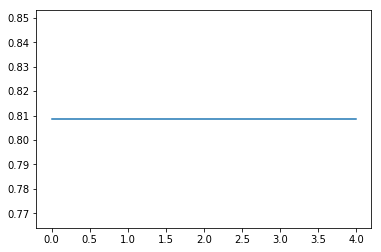

Epoch 5
[ 25.06207848]


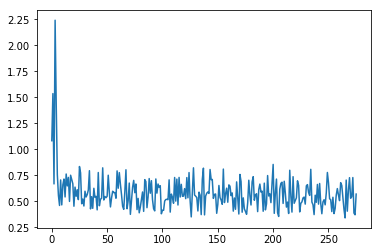

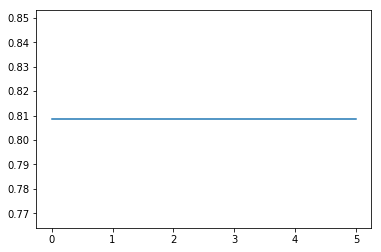

Epoch 6
[ 24.9967823]


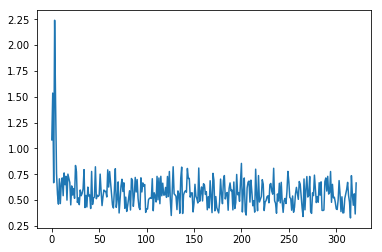

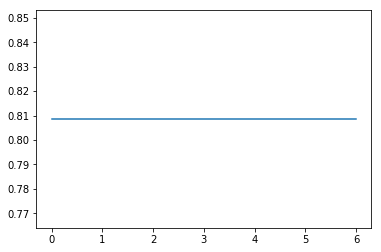

Epoch 7
[ 24.94291687]


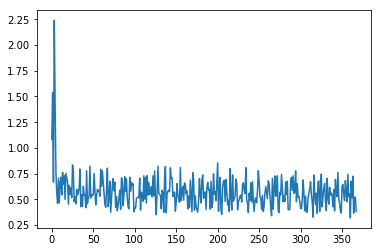

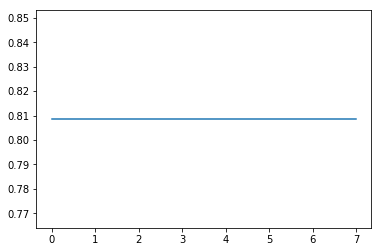

Epoch 8
[ 24.76802254]


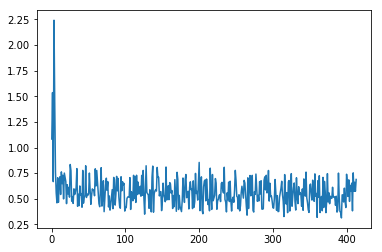

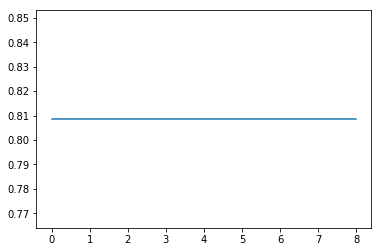

Epoch 9
[ 24.82555771]


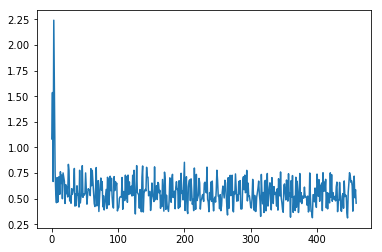

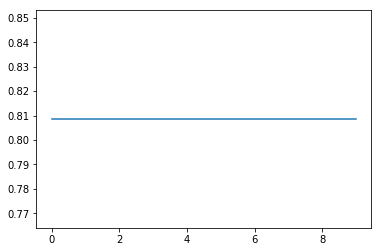

Epoch 10
[ 24.91281128]


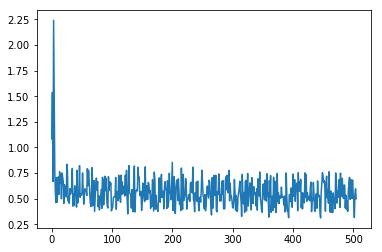

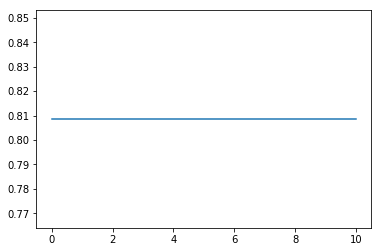

Epoch 11
[ 24.78226852]


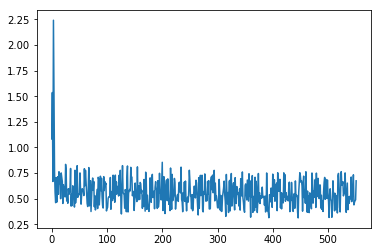

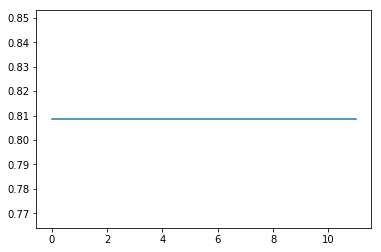

Epoch 12
[ 24.94903946]


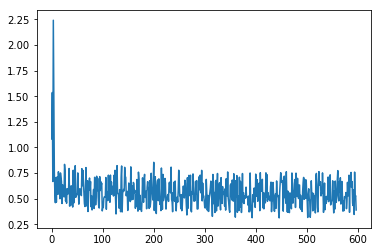

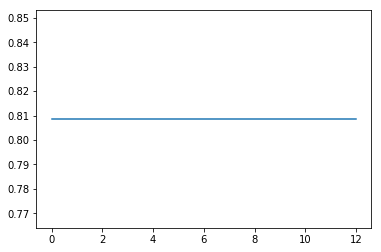

Epoch 13
[ 25.07125473]


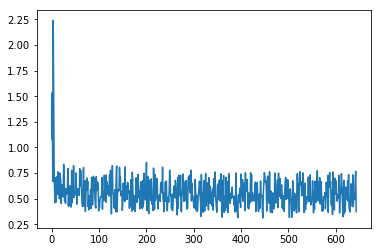

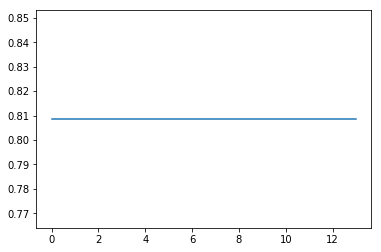

Epoch 14
[ 24.82647324]


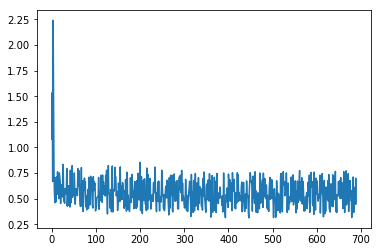

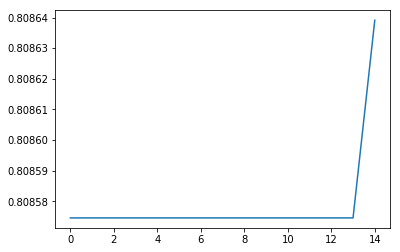

Epoch 15
[ 24.62862778]


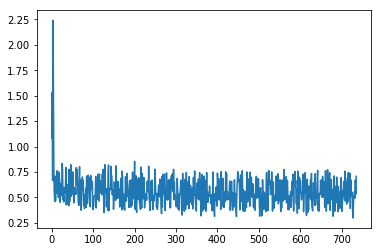

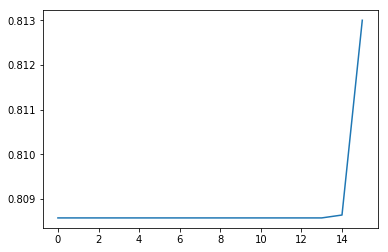

Epoch 16
[ 24.58533669]


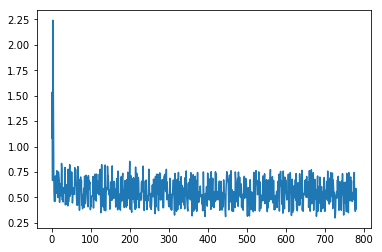

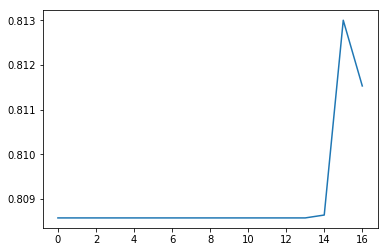

Epoch 17
[ 24.33849907]


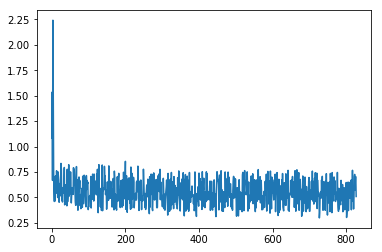

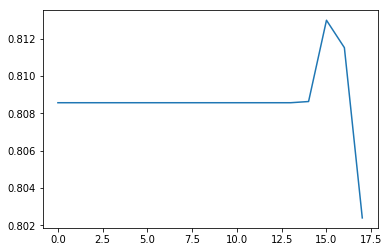

Epoch 18
[ 24.45739937]


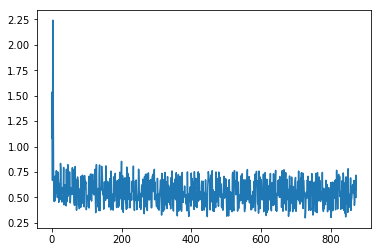

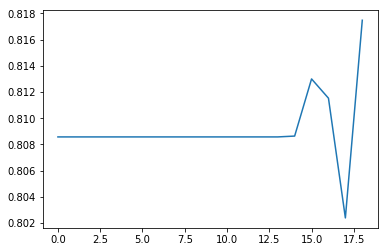

Epoch 19
[ 24.42728424]


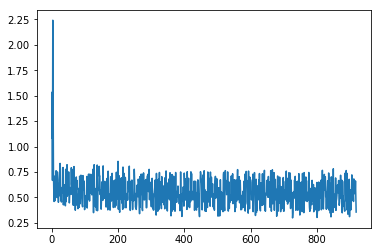

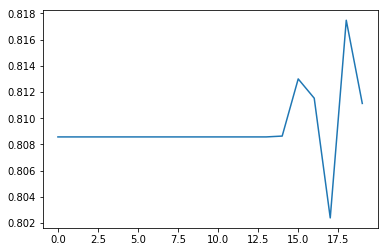

Epoch 20
[ 24.42860222]


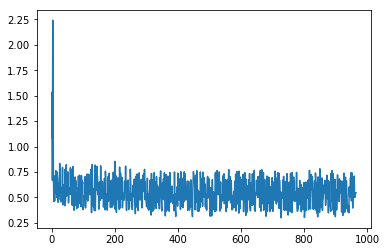

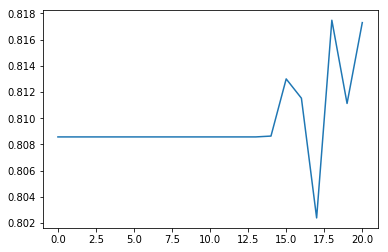

Epoch 21
[ 24.17263222]


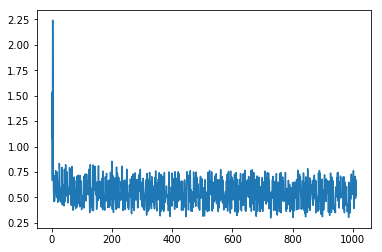

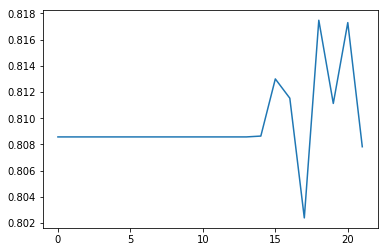

Epoch 22
[ 24.18053055]


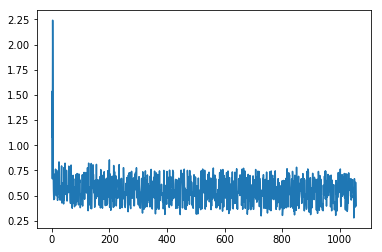

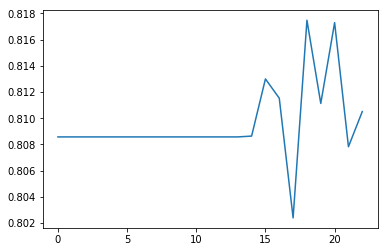

Epoch 23
[ 24.26179695]


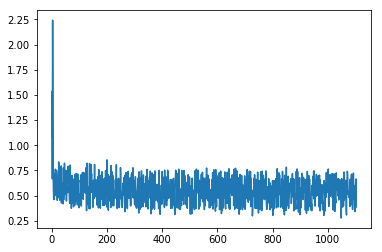

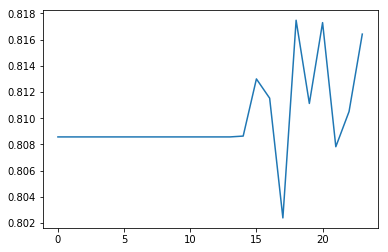

Epoch 24
[ 24.23415184]


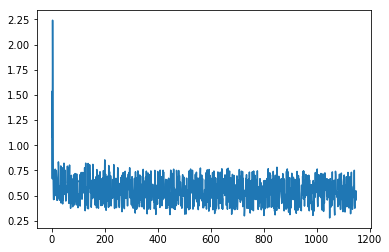

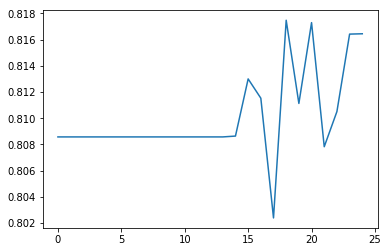

Epoch 25
[ 24.03326035]


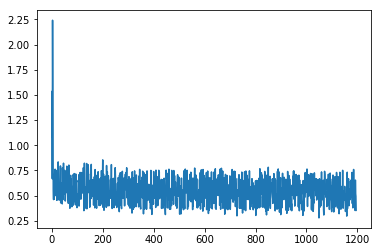

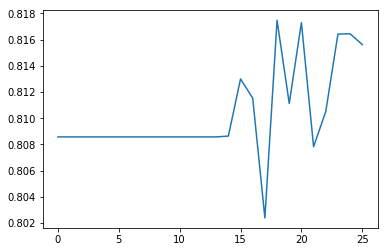

Epoch 26
[ 24.04227638]


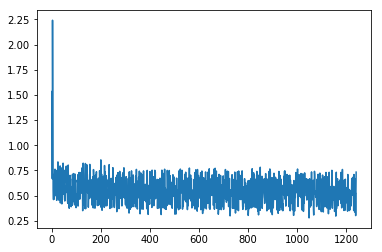

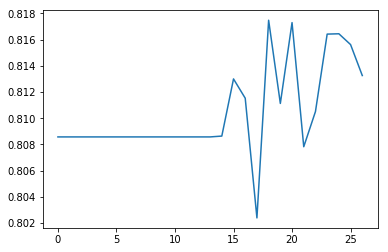

Epoch 27
[ 24.06064224]


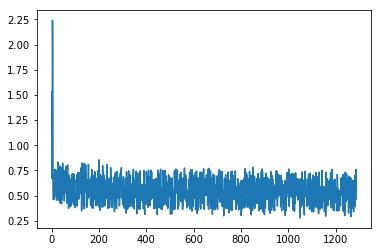

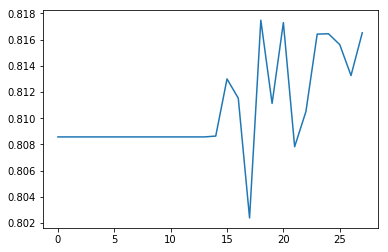

Epoch 28
[ 24.00362587]


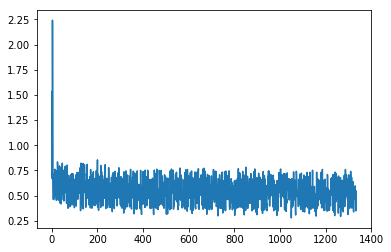

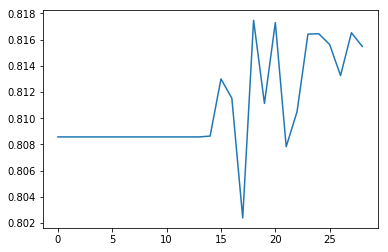

Epoch 29
[ 24.01063919]


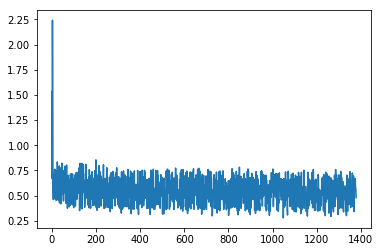

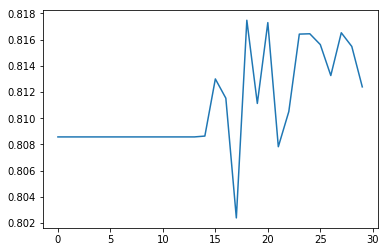

Epoch 30
[ 24.28899574]


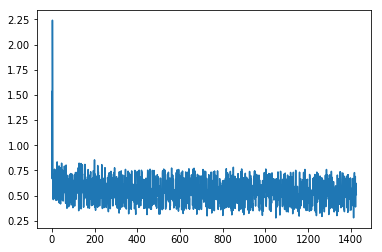

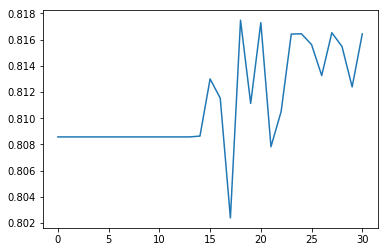

Epoch 31
[ 23.95960045]


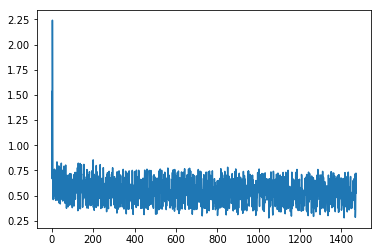

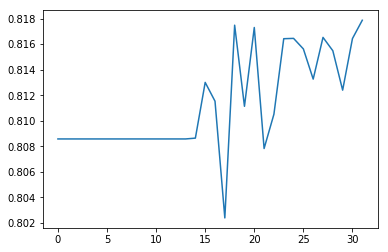

Epoch 32
[ 23.93684006]


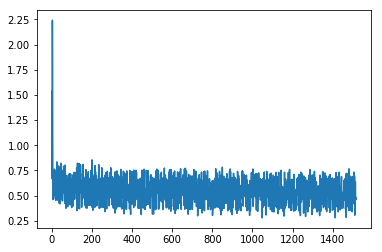

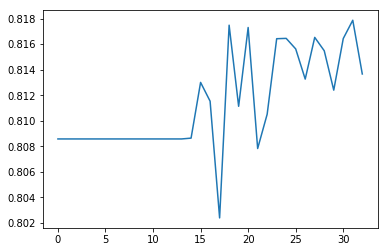

Epoch 33
[ 23.8884964]


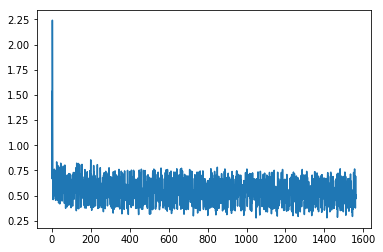

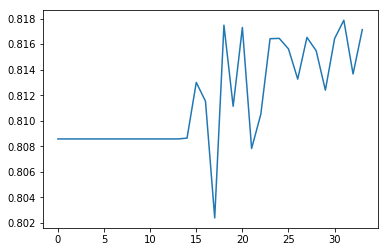

Epoch 34
[ 23.79987335]


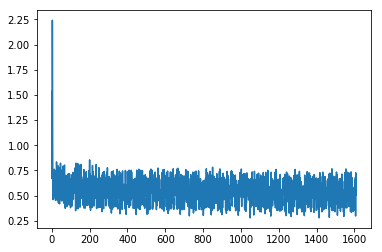

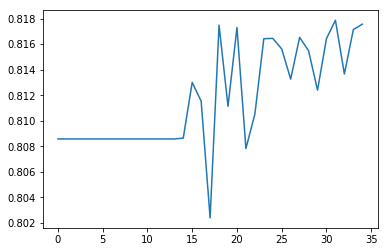

Epoch 35
[ 24.28191185]


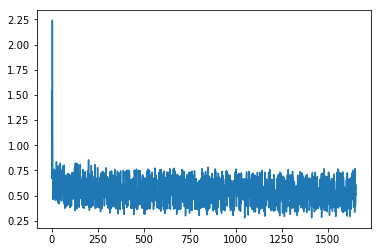

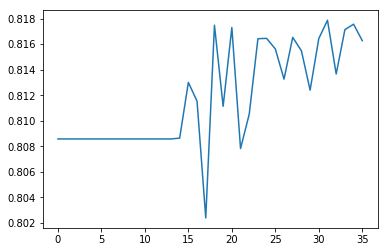

Epoch 36
[ 24.29089737]


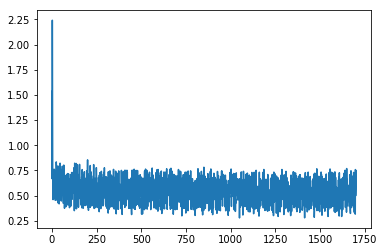

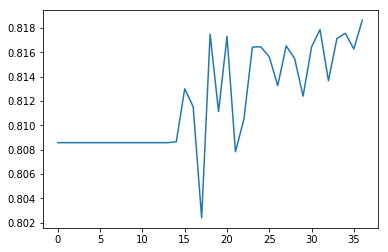

Epoch 37
[ 24.18325043]


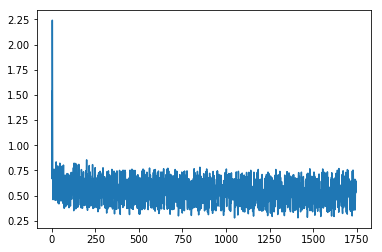

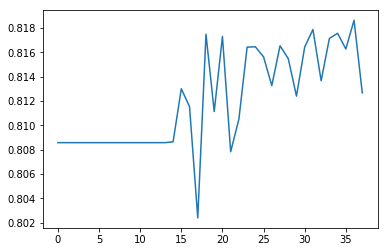

Epoch 38
[ 24.2820816]


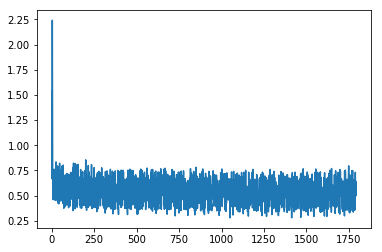

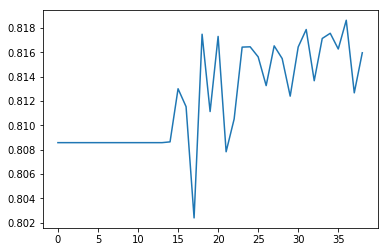

Epoch 39
[ 24.02061272]


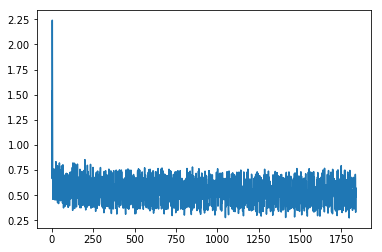

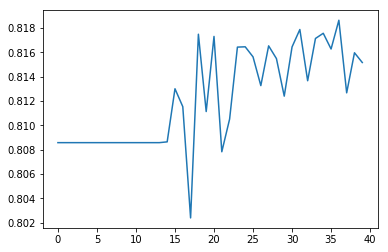

Epoch 40
[ 24.29178619]


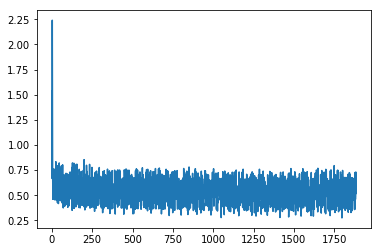

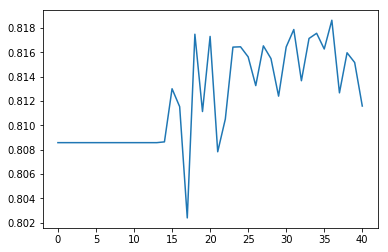

Epoch 41
[ 24.48251534]


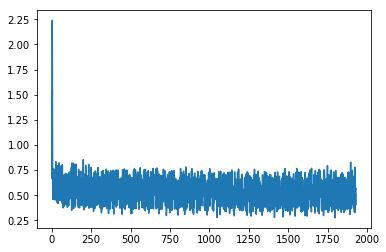

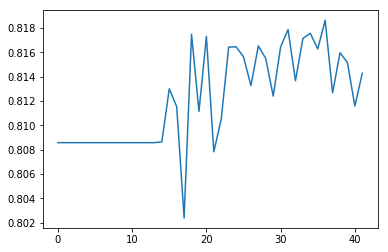

Epoch 42
[ 24.00079727]


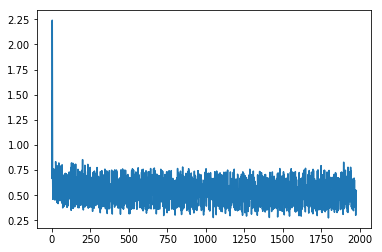

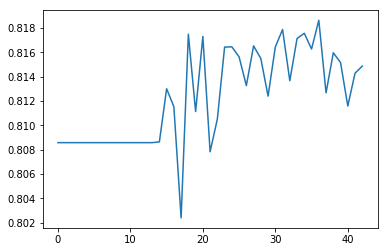

Epoch 43
[ 24.29089355]


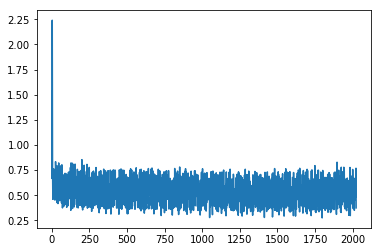

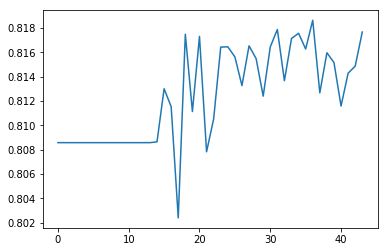

Epoch 44
[ 24.07522011]


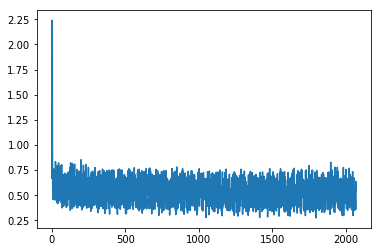

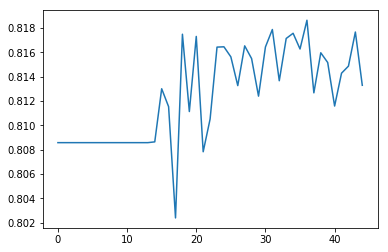

Epoch 45
[ 24.0826664]


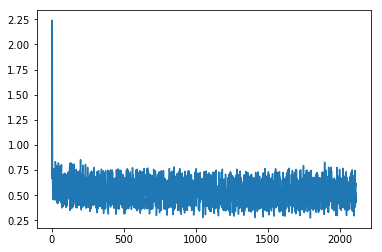

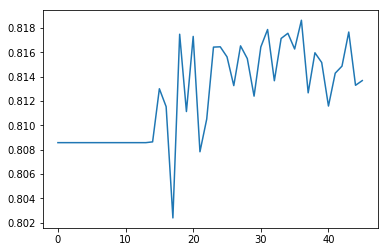

Epoch 46
[ 24.03524017]


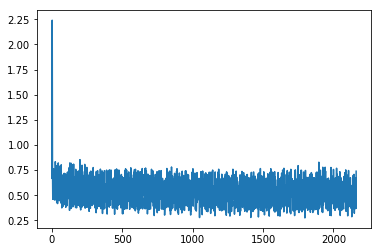

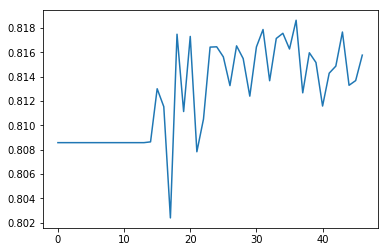

Epoch 47
[ 24.111269]


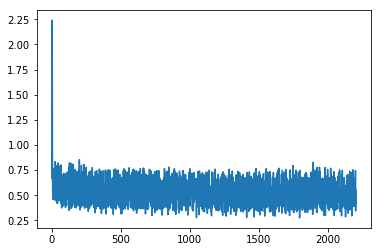

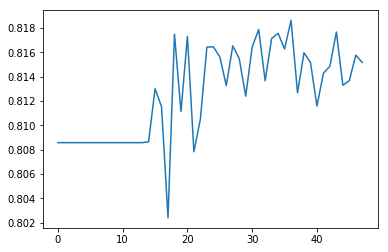

Epoch 48
[ 24.02314186]


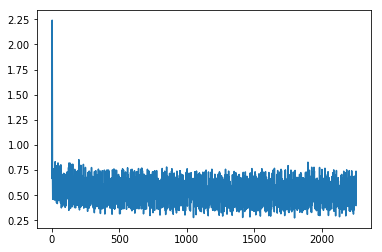

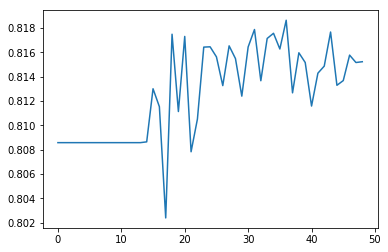

Epoch 49
[ 24.0612278]


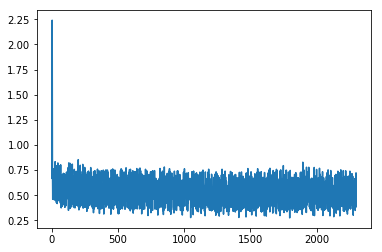

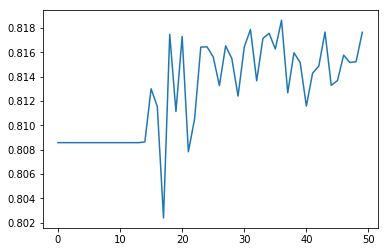

Epoch 50
[ 23.96710014]


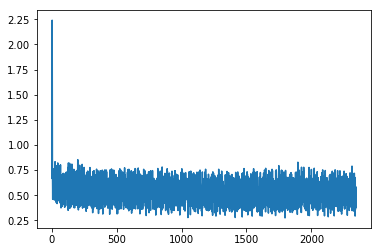

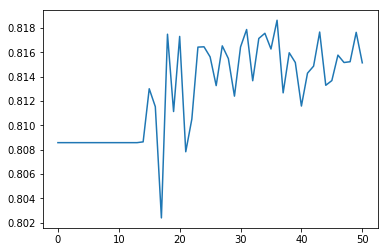

Epoch 51
[ 24.28509521]


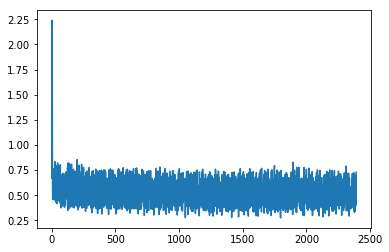

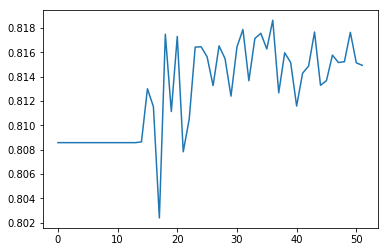

Epoch 52
[ 23.79916954]


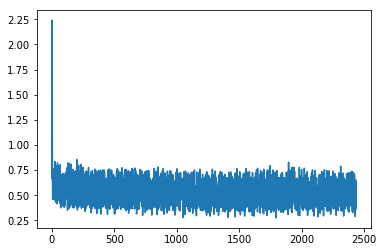

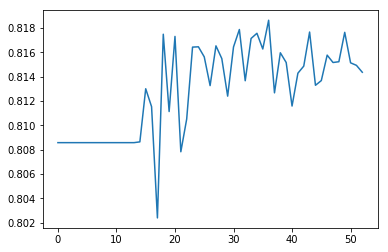

Epoch 53
[ 23.94082832]


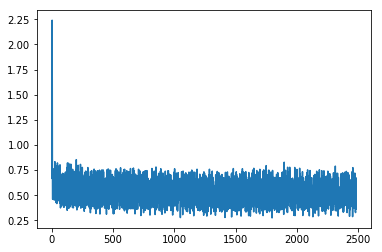

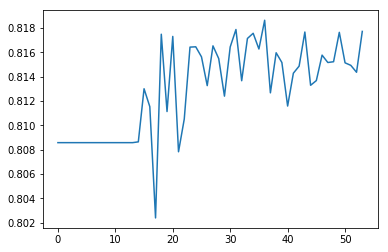

Epoch 54
[ 24.0898037]


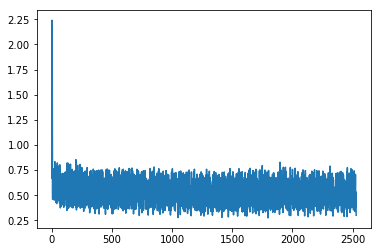

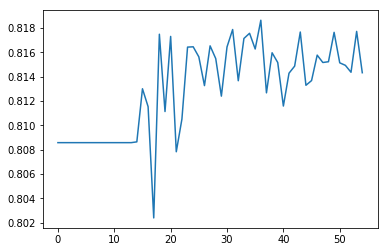

Epoch 55
[ 24.65984154]


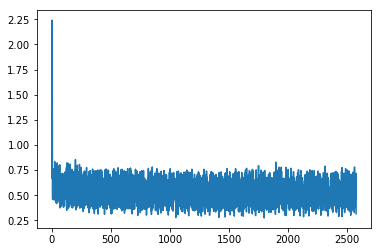

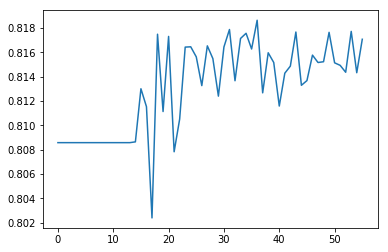

Epoch 56
[ 24.00221634]


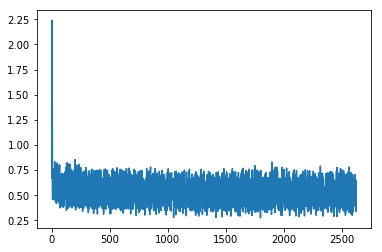

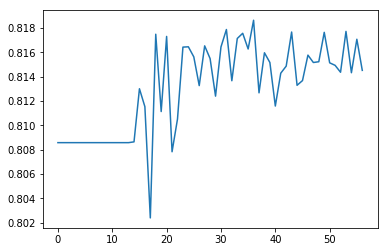

Epoch 57
[ 24.08547211]


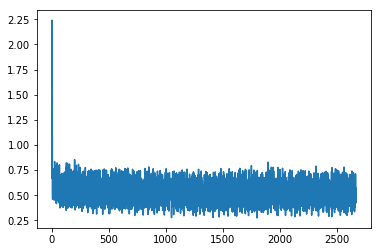

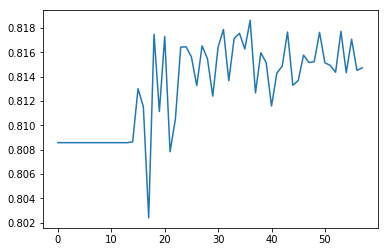

Epoch 58
[ 24.08702469]


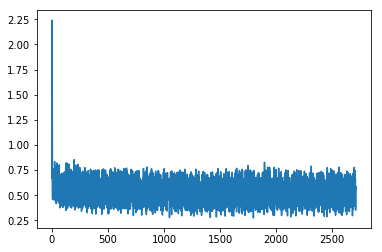

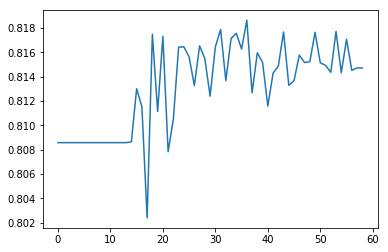

Epoch 59
[ 23.87397385]


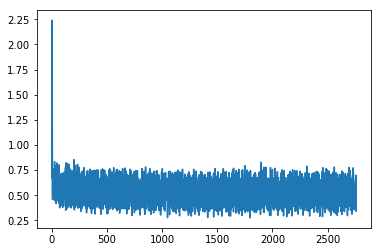

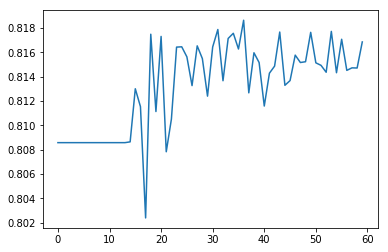

Epoch 60
[ 23.75038528]


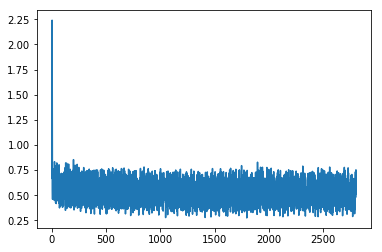

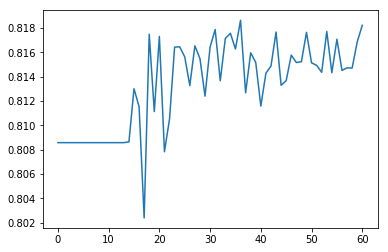

Epoch 61
[ 23.50720596]


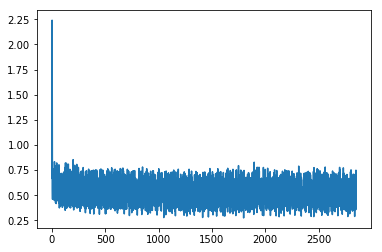

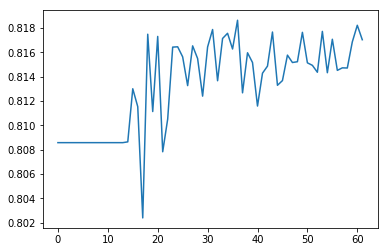

Epoch 62
[ 23.68311691]


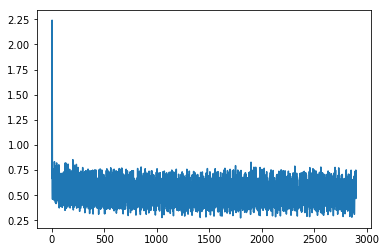

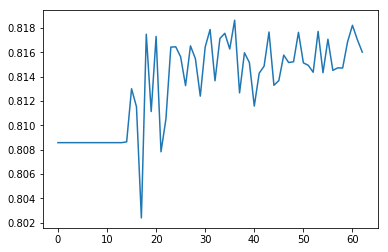

Epoch 63
[ 23.60639191]


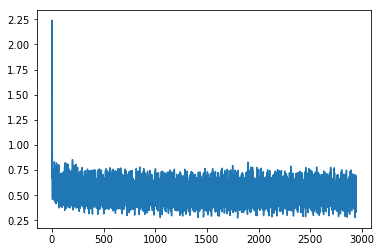

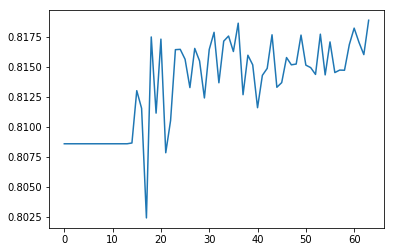

Epoch 64
[ 23.4873848]


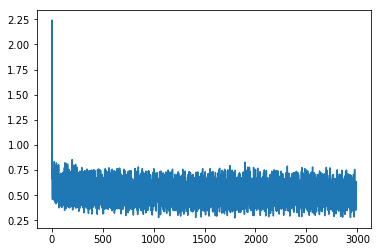

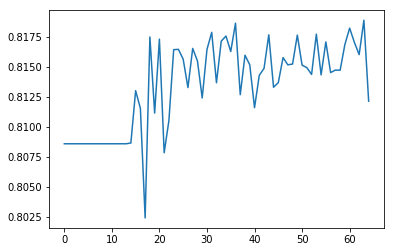

Epoch 65
[ 23.92180634]


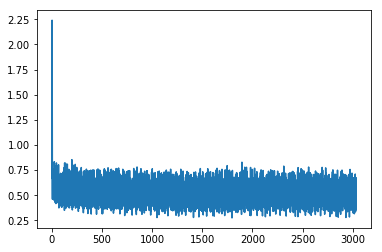

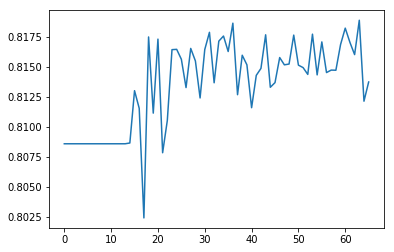

Epoch 66
[ 23.51528168]


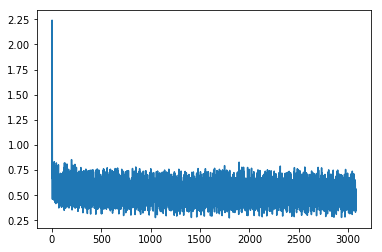

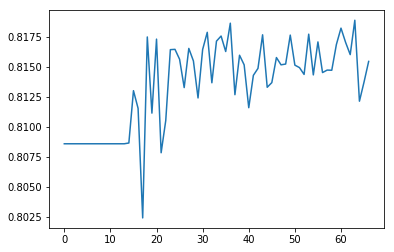

Epoch 67
[ 23.61886787]


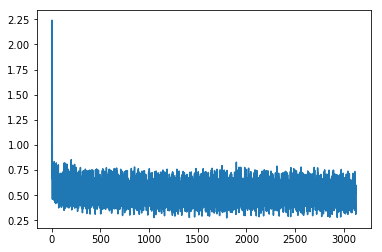

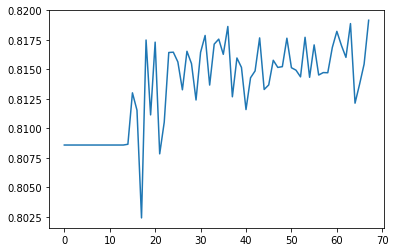

Epoch 68
[ 23.94693565]


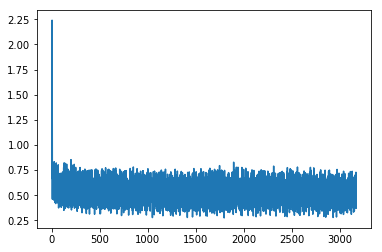

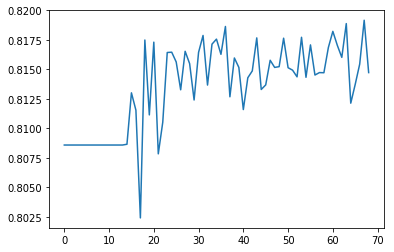

Epoch 69
[ 23.34923172]


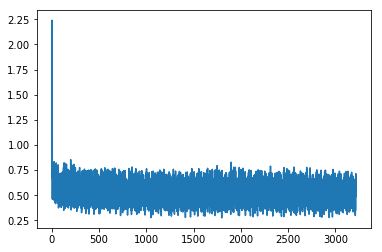

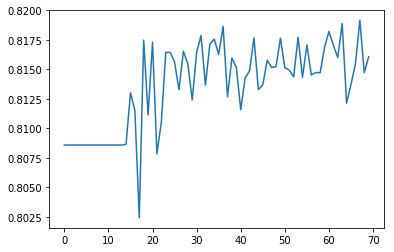

Epoch 70
[ 23.51472473]


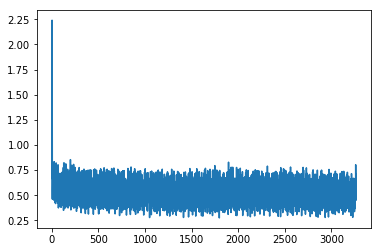

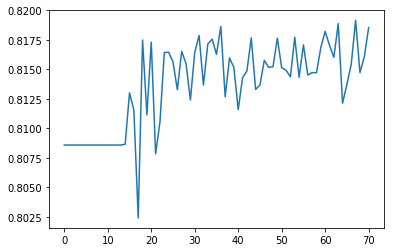

Epoch 71
[ 23.25741005]


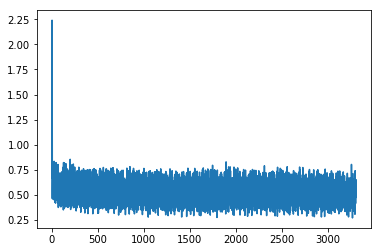

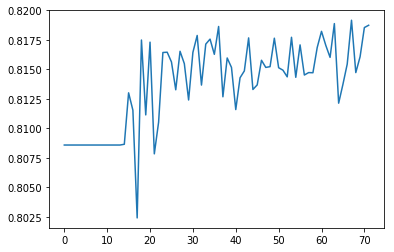

Epoch 72
[ 23.48827362]


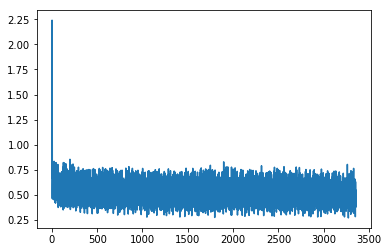

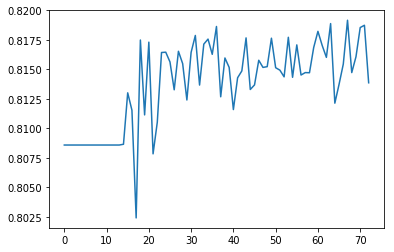

Epoch 73
[ 23.55099487]


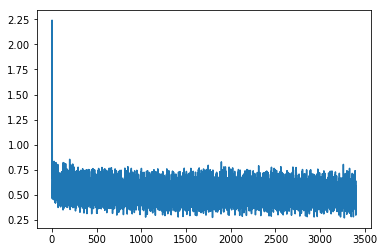

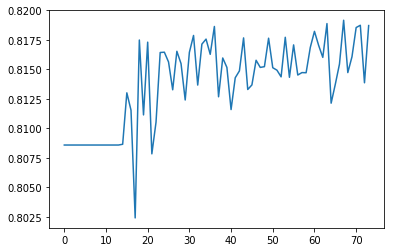

Epoch 74
[ 23.71660995]


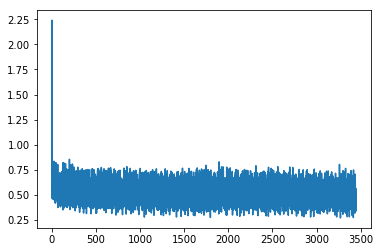

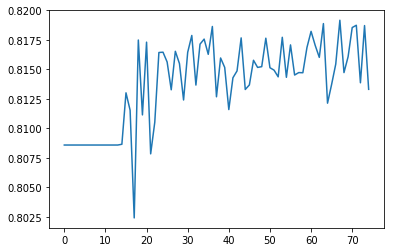

Epoch 75
[ 23.37901115]


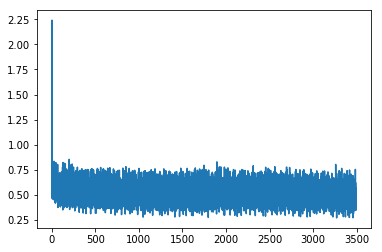

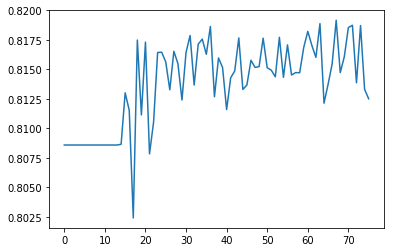

Epoch 76
[ 23.34757233]


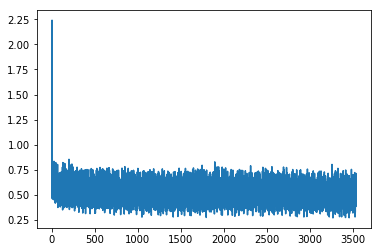

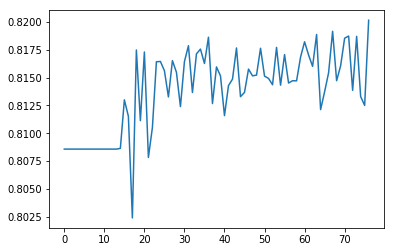

Epoch 77
[ 23.29260063]


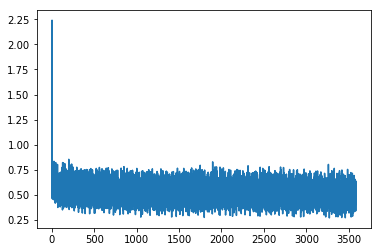

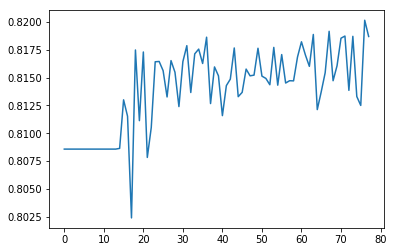

Epoch 78
[ 23.47665405]


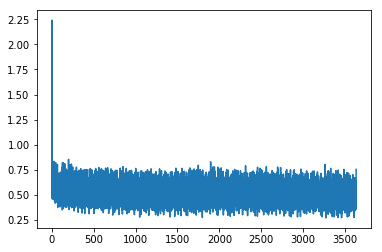

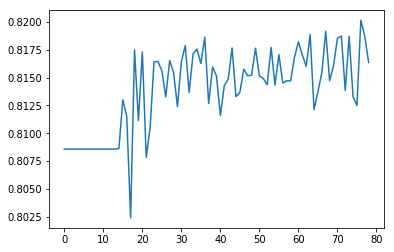

Epoch 79
[ 23.25225449]


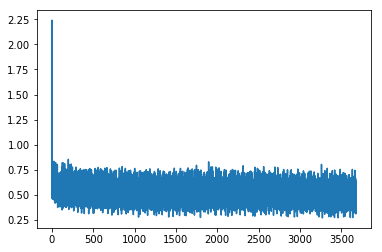

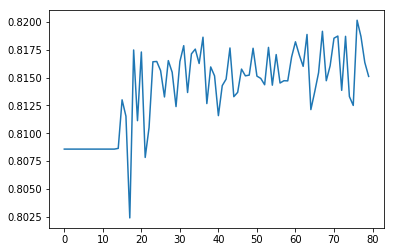

Epoch 80
[ 23.60685921]


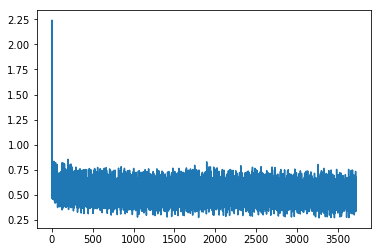

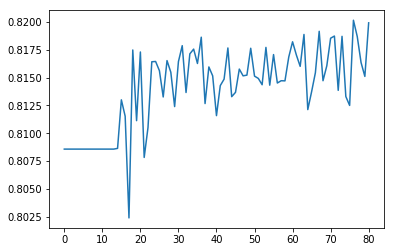

Epoch 81
[ 23.60939789]


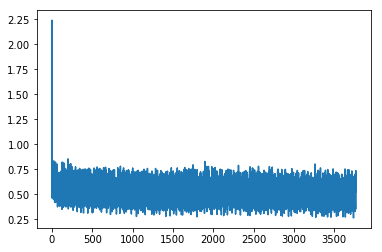

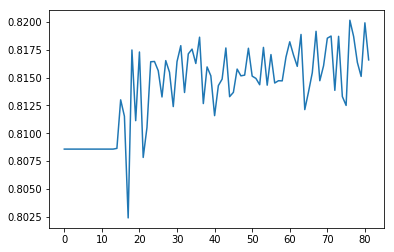

Epoch 82
[ 23.17345238]


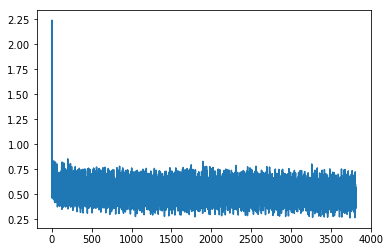

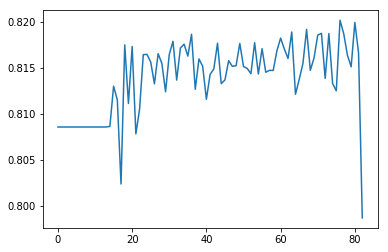

Epoch 83
[ 23.90260315]


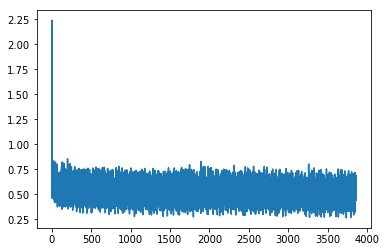

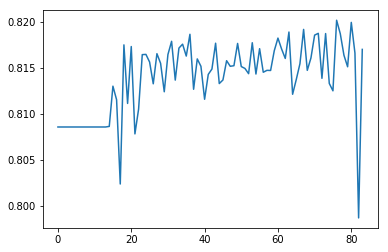

Epoch 84
[ 23.15137291]


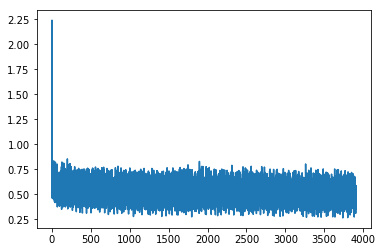

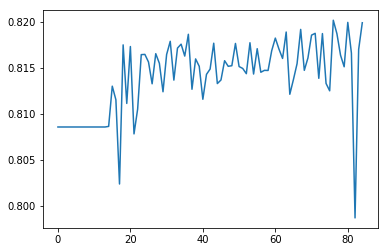

Epoch 85
[ 23.30244446]


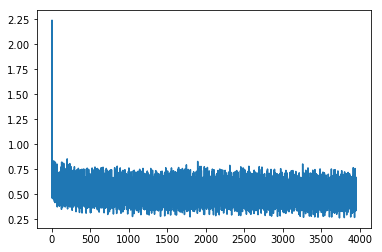

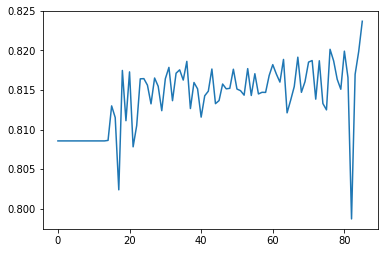

Epoch 86
[ 23.07006645]


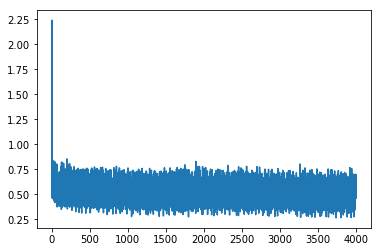

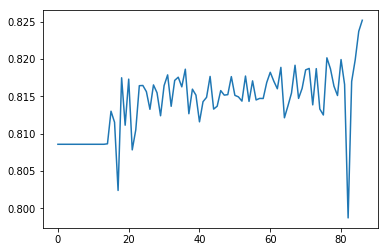

Epoch 87
[ 23.30495834]


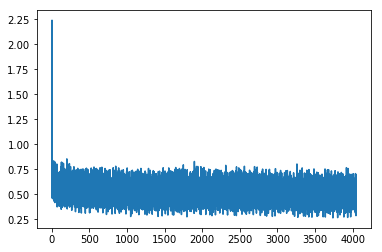

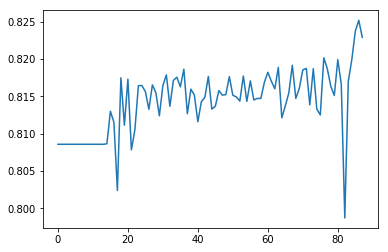

Epoch 88
[ 23.66574669]


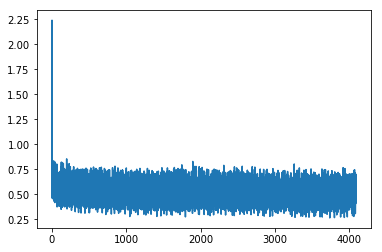

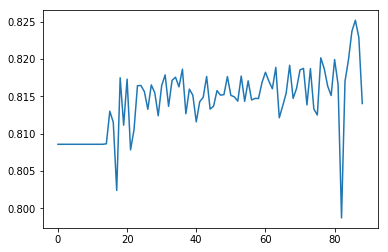

Epoch 89
[ 23.2539711]


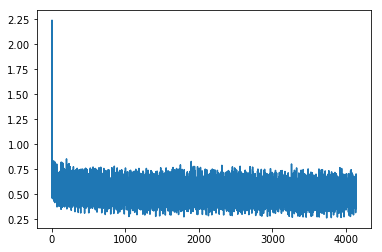

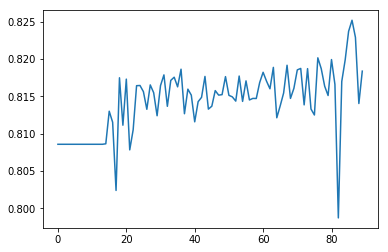

Epoch 90
[ 23.10259056]


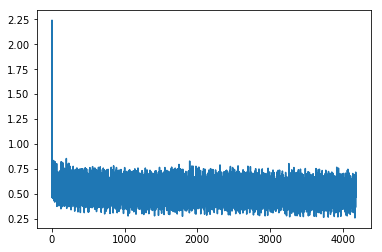

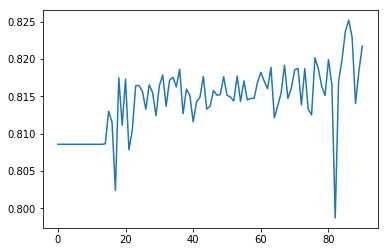

Epoch 91
[ 23.61664772]


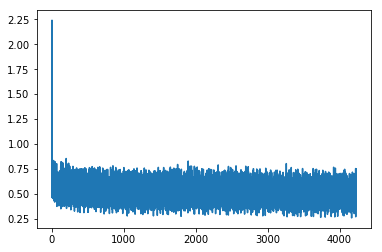

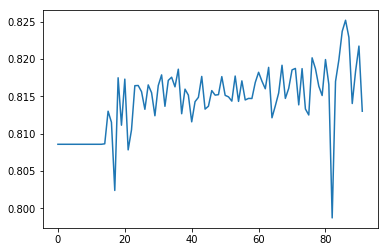

Epoch 92
[ 22.8939209]


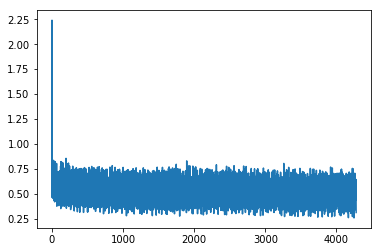

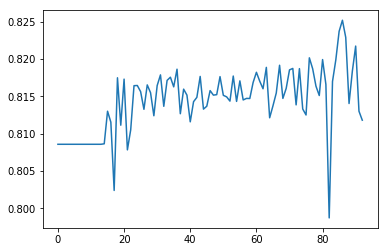

Epoch 93
[ 23.49437714]


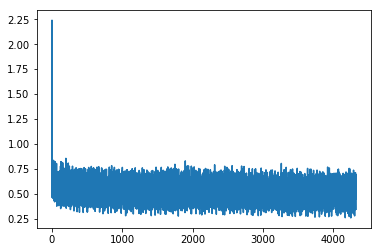

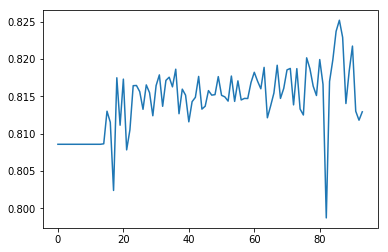

Epoch 94
[ 23.36358643]


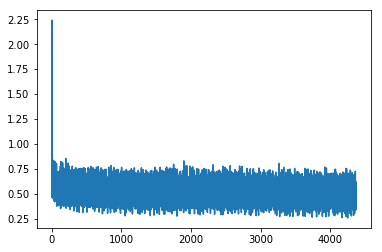

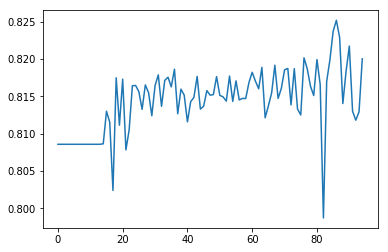

Epoch 95
[ 23.22841454]


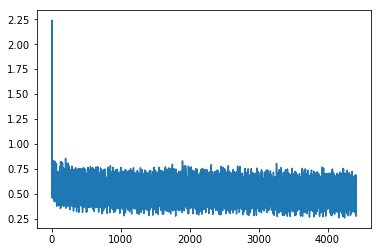

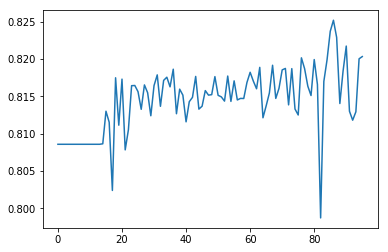

Epoch 96
[ 23.05064583]


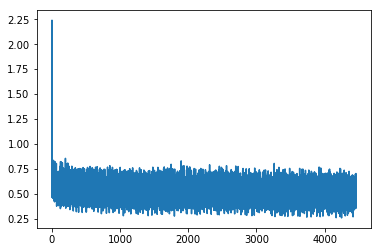

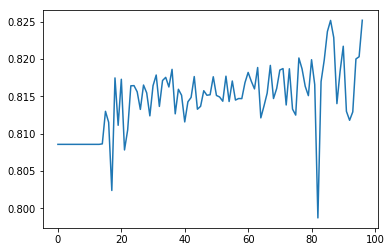

Epoch 97
[ 22.98375893]


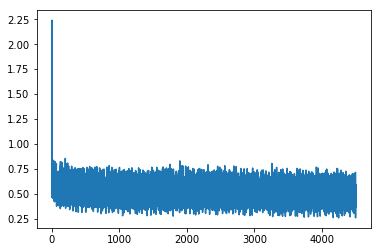

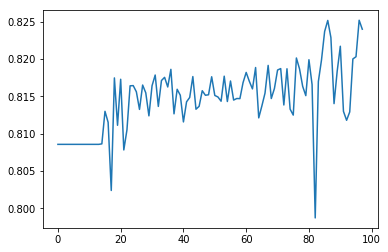

Epoch 98
[ 22.90247154]


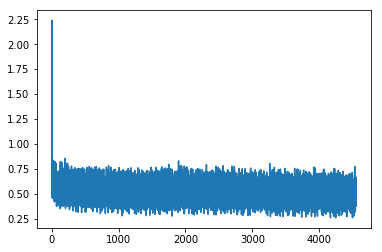

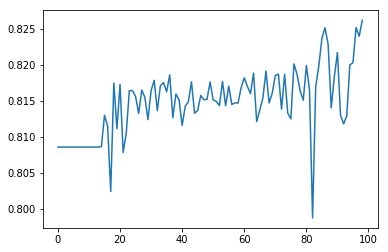

Epoch 99
[ 22.79268646]


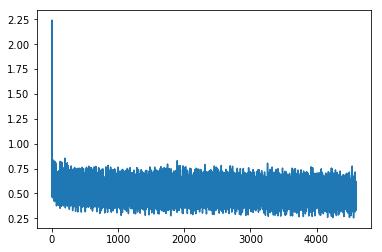

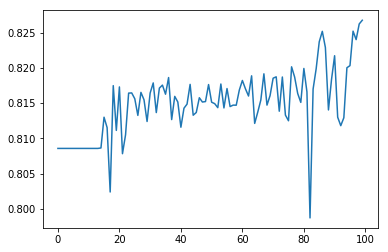

Epoch 100
[ 22.73122215]


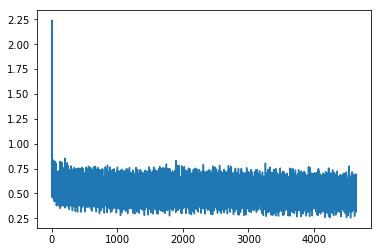

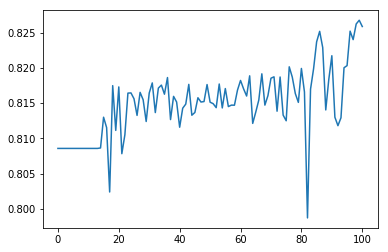

Epoch 101
[ 22.42940712]


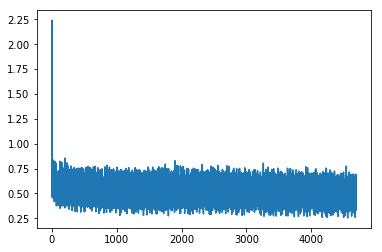

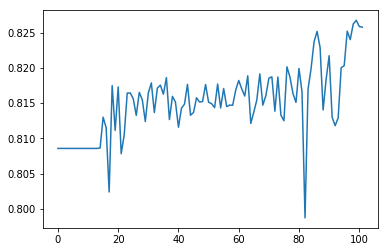

Epoch 102
[ 22.4191246]


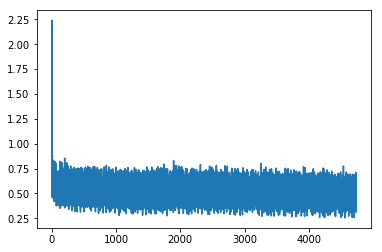

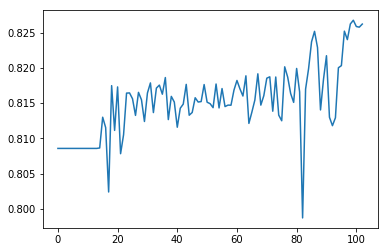

Epoch 103
[ 22.39536667]


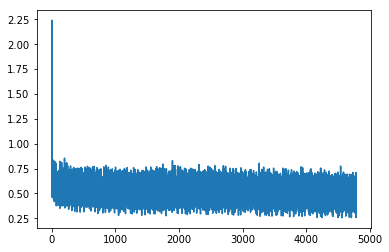

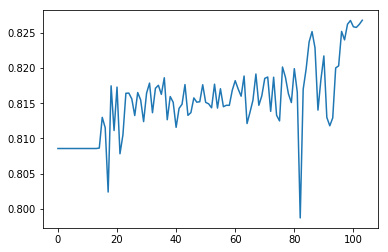

Epoch 104
[ 22.34802055]


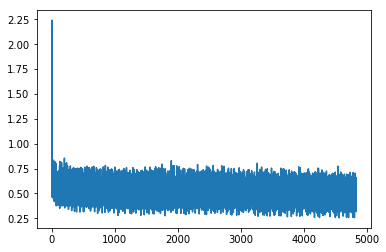

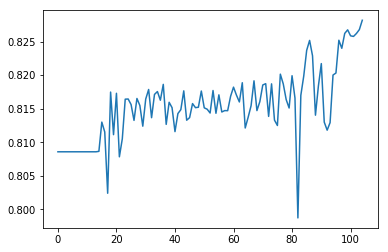

Epoch 105
[ 22.45980263]


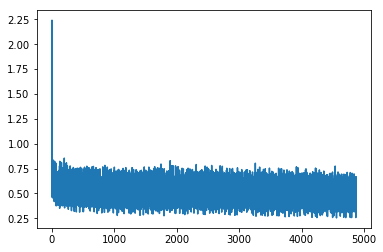

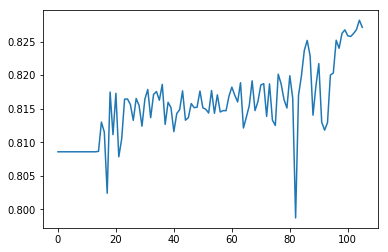

Epoch 106
[ 22.36362076]


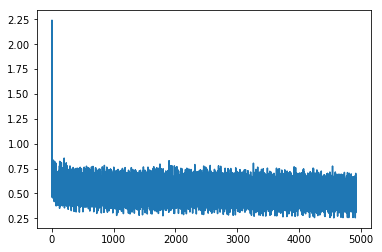

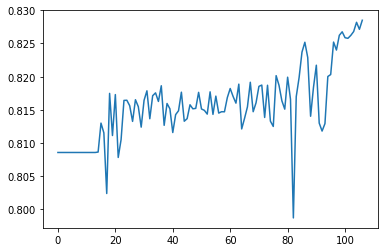

Epoch 107
[ 22.33983421]


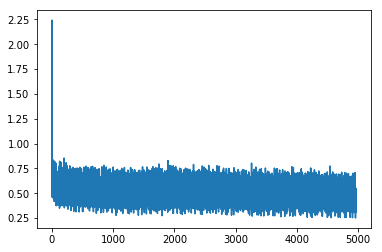

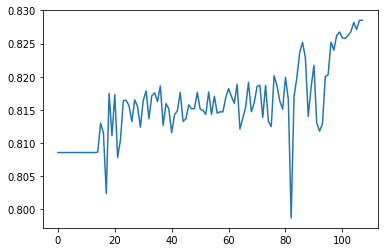

Epoch 108
[ 22.33675766]


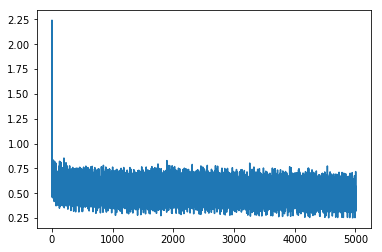

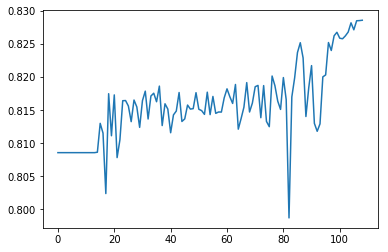

Epoch 109
[ 22.30721092]


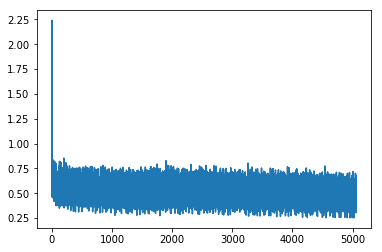

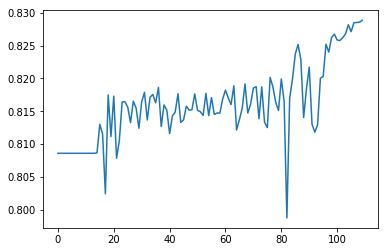

Epoch 110
[ 22.3370266]


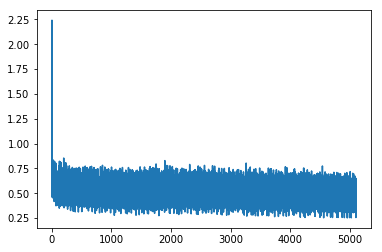

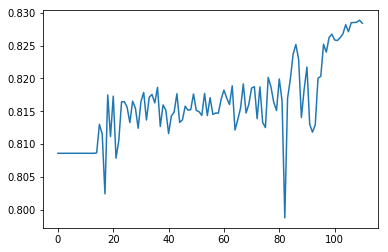

Epoch 111
[ 22.31986618]


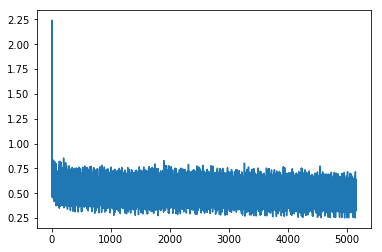

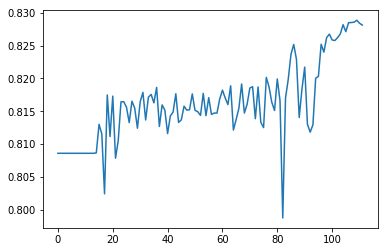

Epoch 112
[ 22.28494072]


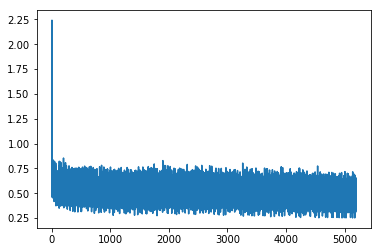

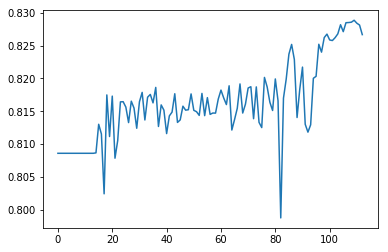

Epoch 113
[ 22.33454132]


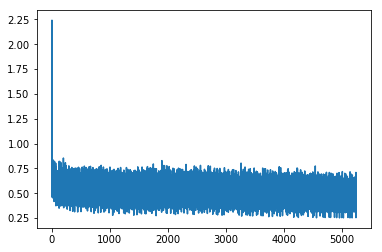

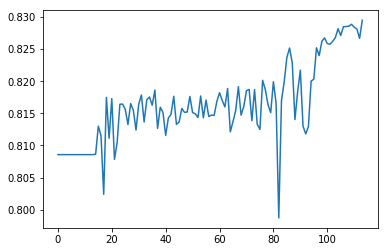

Epoch 114
[ 22.33602715]


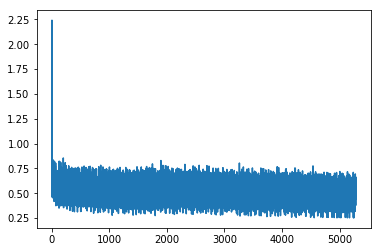

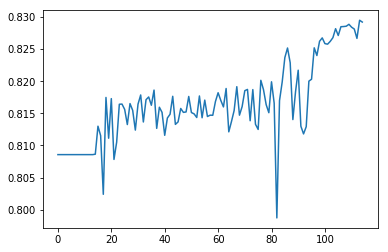

Epoch 115
[ 22.28281212]


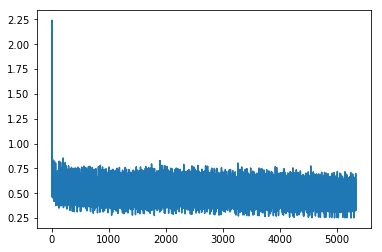

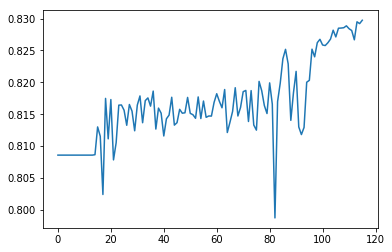

Epoch 116
[ 22.29833221]


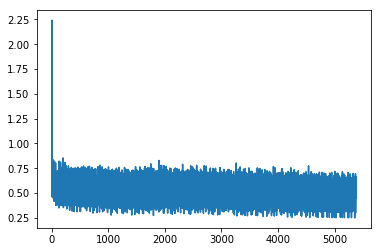

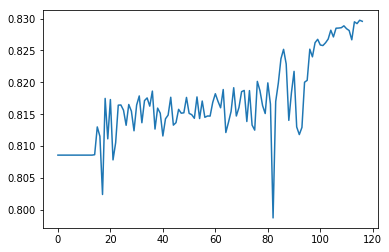

Epoch 117
[ 22.26834869]


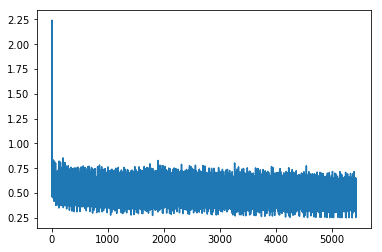

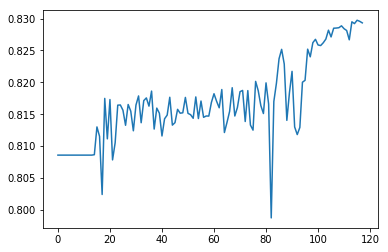

Epoch 118
[ 22.27073288]


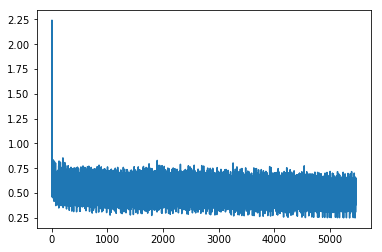

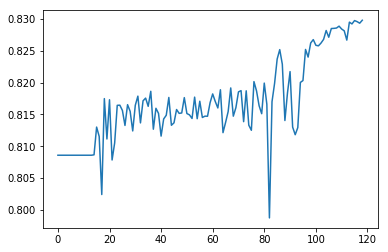

Epoch 119
[ 22.23203659]


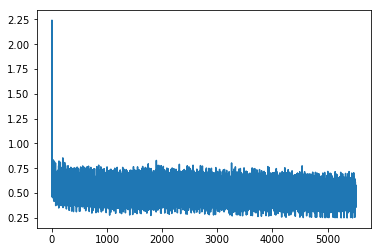

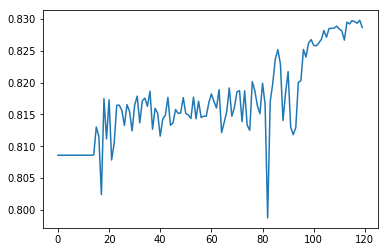

Epoch 120
[ 22.25659752]


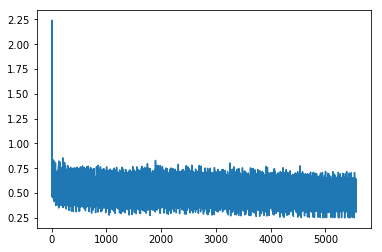

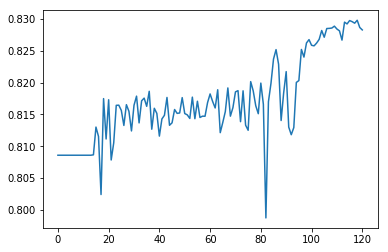

Epoch 121
[ 22.31274796]


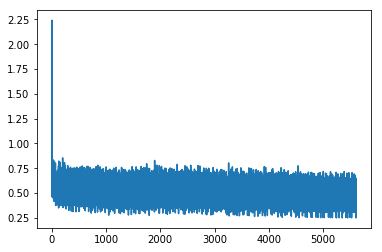

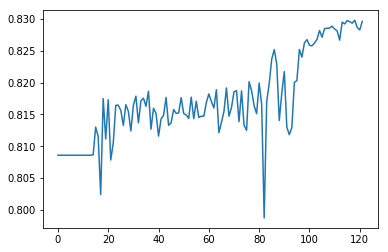

Epoch 122
[ 22.22024536]


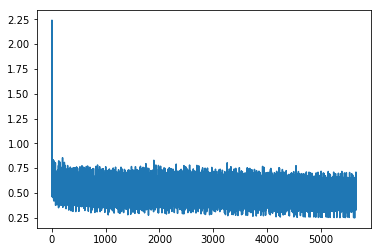

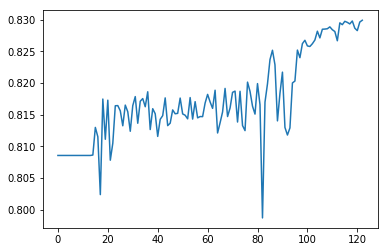

Epoch 123
[ 22.24195862]


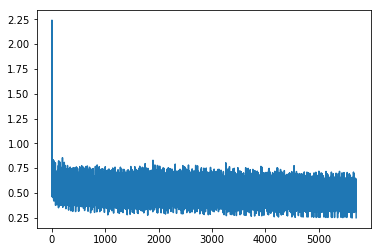

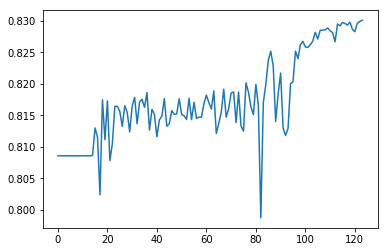

Epoch 124
[ 22.21781921]


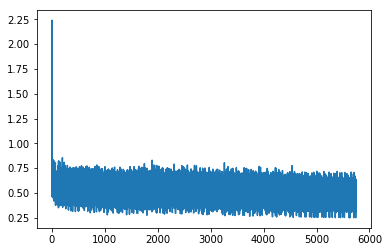

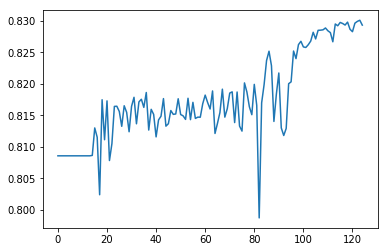

Epoch 125
[ 22.25561523]


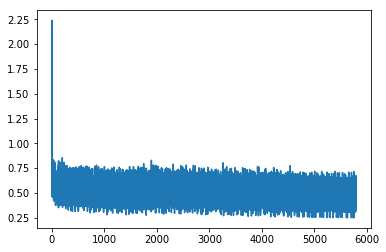

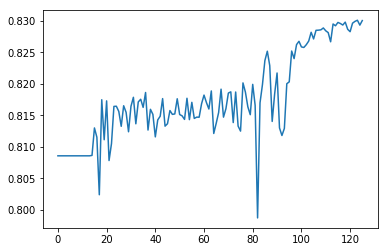

Epoch 126
[ 22.16202164]


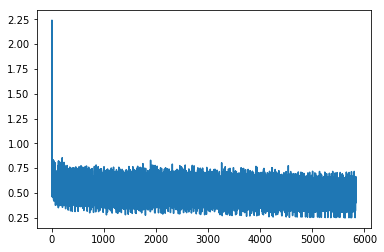

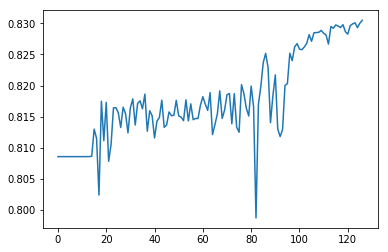

Epoch 127
[ 22.16259956]


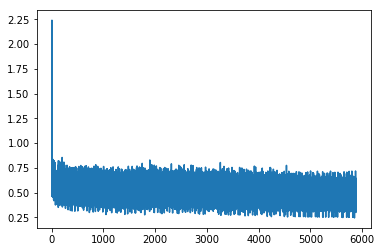

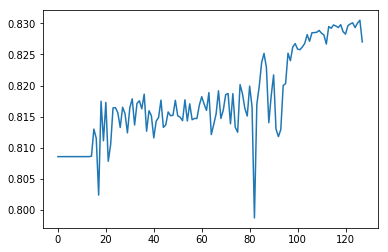

Epoch 128
[ 22.24323463]


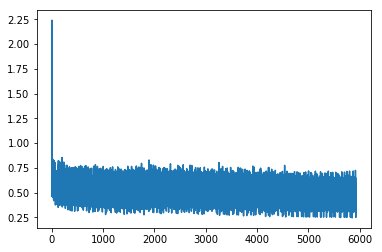

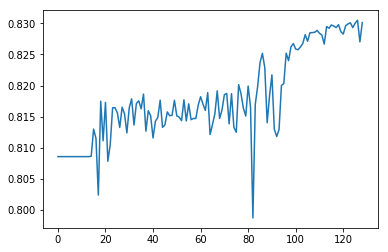

Epoch 129
[ 22.14910316]


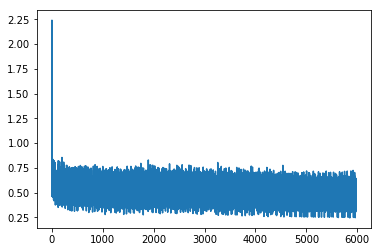

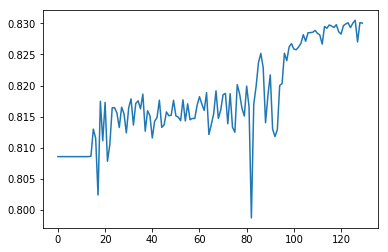

Epoch 130
[ 22.16422272]


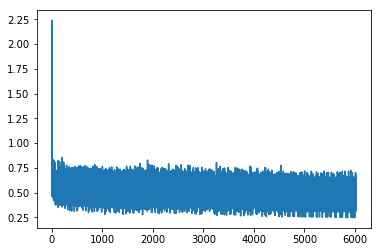

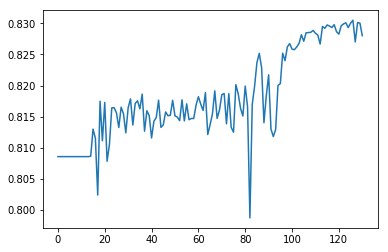

Epoch 131
[ 22.10027695]


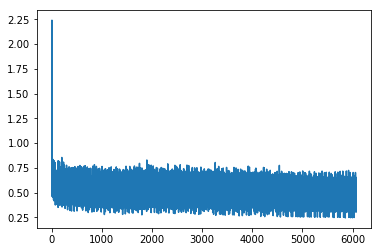

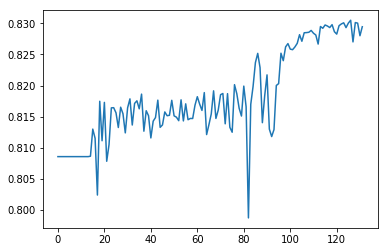

Epoch 132
[ 22.09605217]


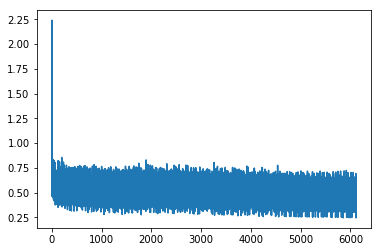

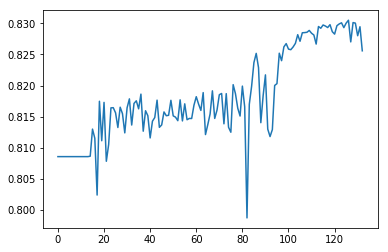

Epoch 133
[ 22.06251335]


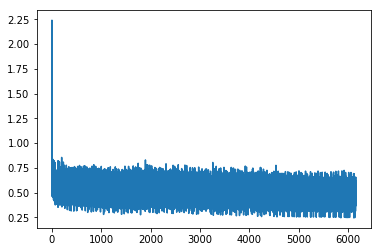

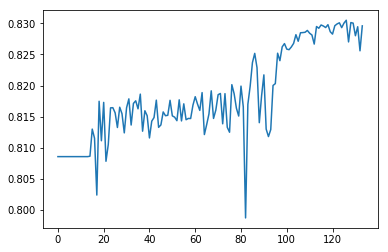

Epoch 134
[ 22.11150169]


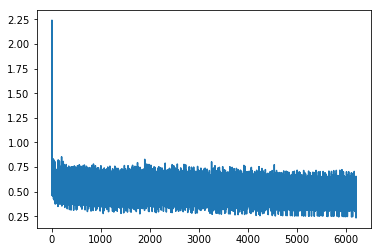

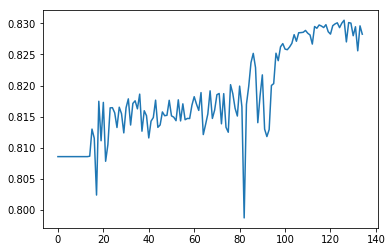

Epoch 135
[ 22.07035255]


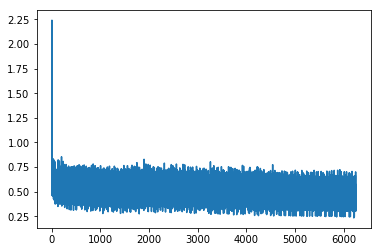

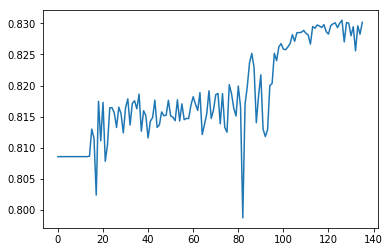

Epoch 136
[ 22.0229187]


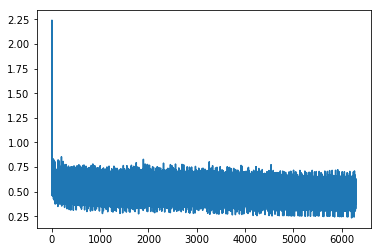

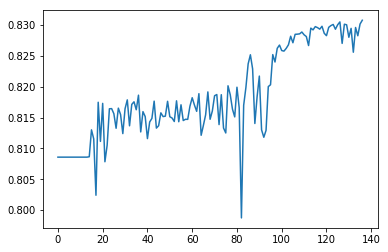

Epoch 137
[ 22.01461411]


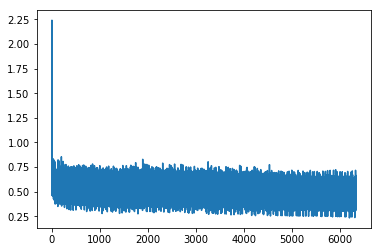

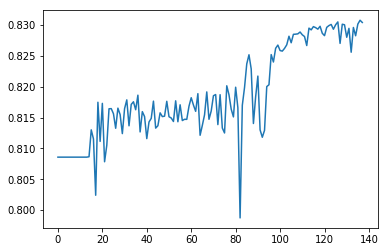

Epoch 138
[ 21.98477745]


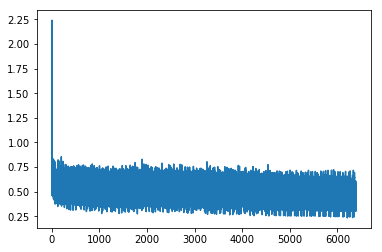

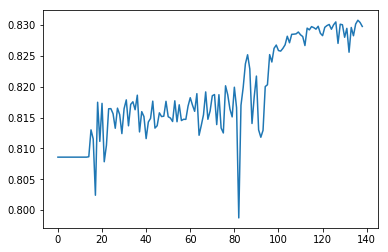

Epoch 139
[ 21.9483223]


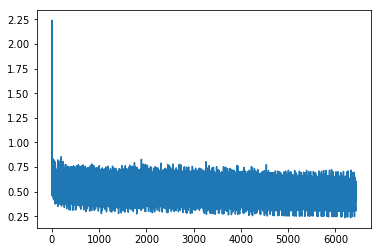

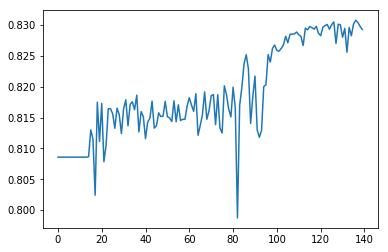

Epoch 140
[ 22.03149223]


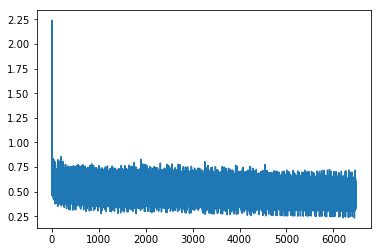

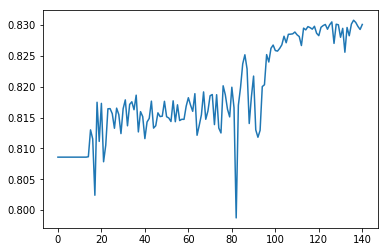

Epoch 141
[ 22.00400925]


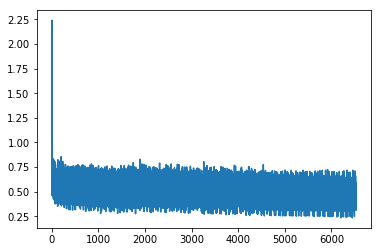

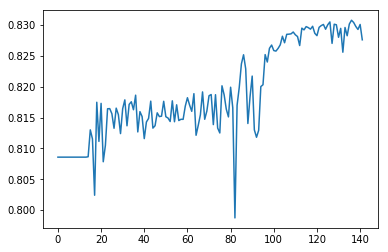

Epoch 142
[ 21.9764061]


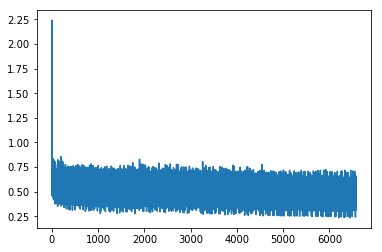

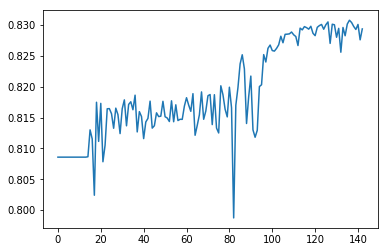

Epoch 143
[ 22.03012276]


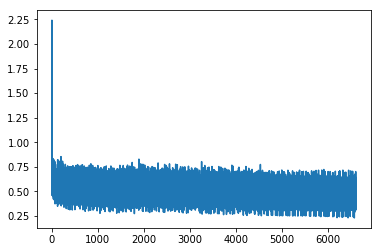

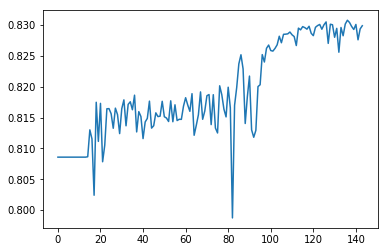

Epoch 144
[ 22.03528404]


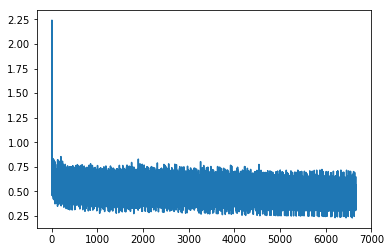

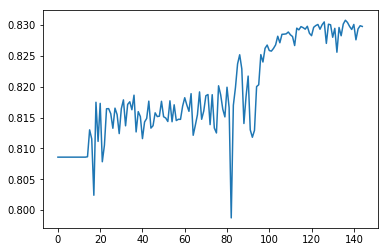

Epoch 145
[ 21.99586678]


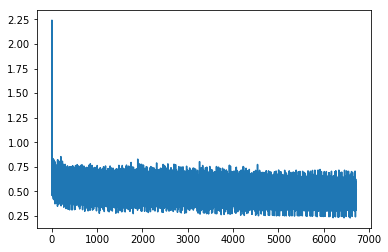

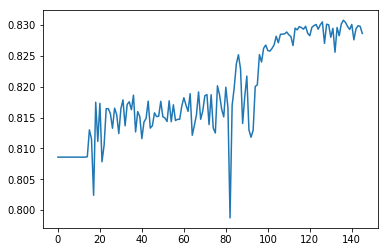

Epoch 146
[ 21.91052246]


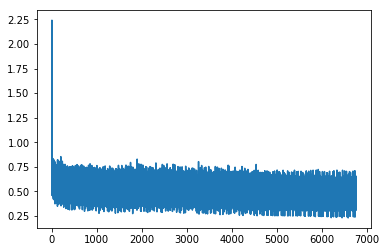

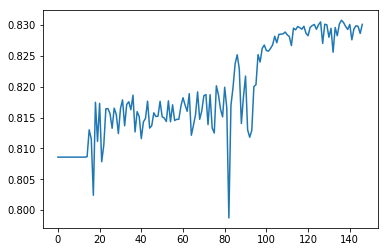

Epoch 147
[ 21.90655327]


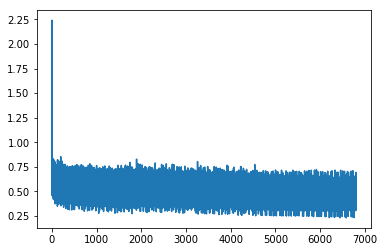

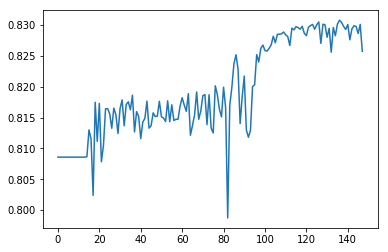

Epoch 148
[ 21.85915375]


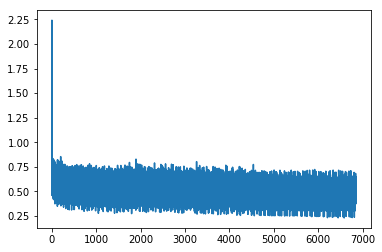

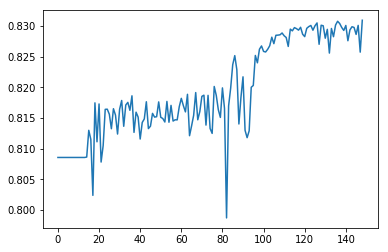

Epoch 149
[ 21.83275223]


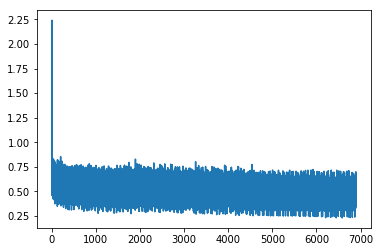

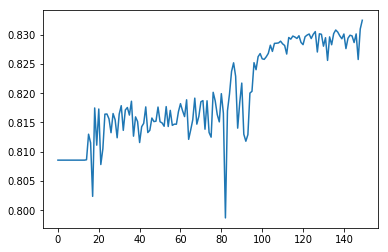

Epoch 150
[ 21.78847694]


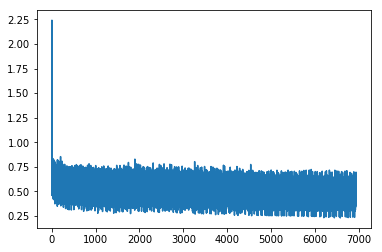

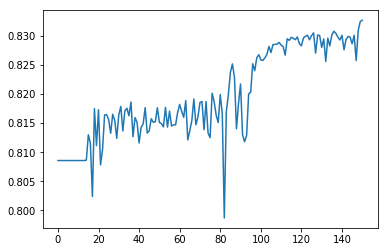

Epoch 151
[ 21.79777336]


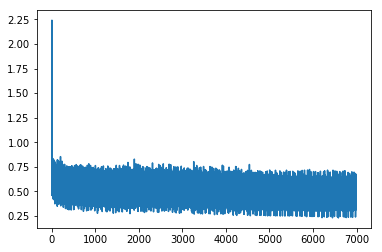

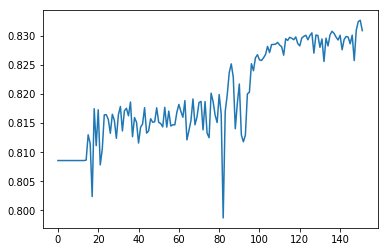

Epoch 152
[ 21.797575]


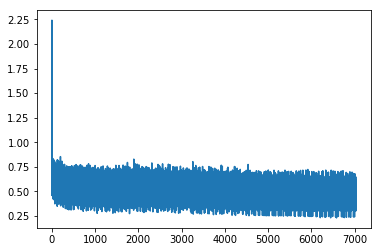

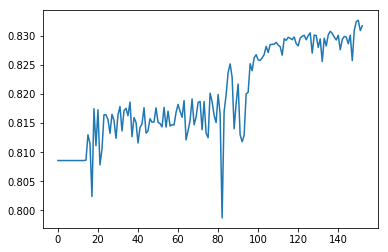

Epoch 153
[ 21.75219727]


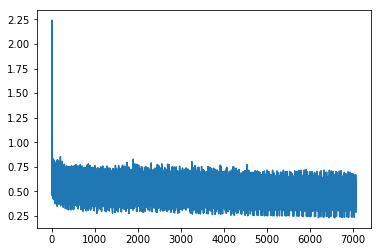

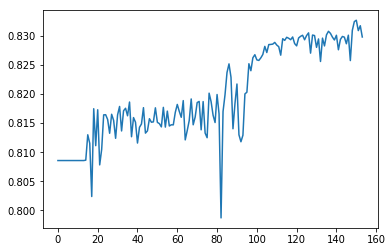

Epoch 154
[ 21.95195198]


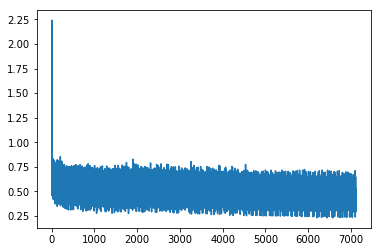

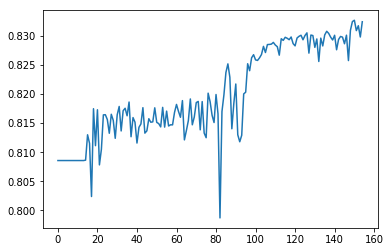

Epoch 155
[ 21.66842651]


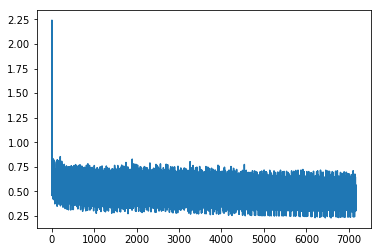

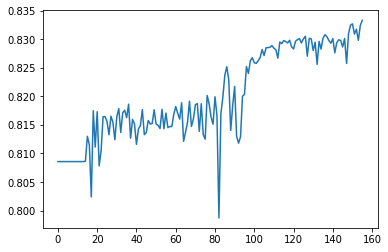

Epoch 156
[ 21.64676094]


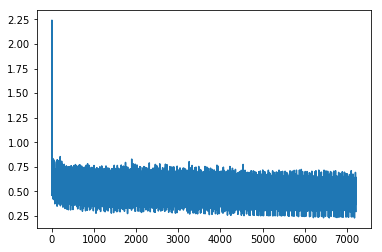

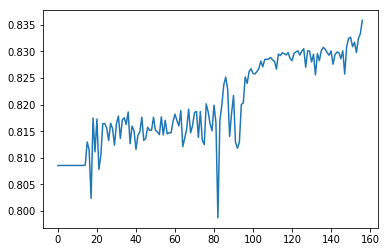

Epoch 157
[ 21.63789558]


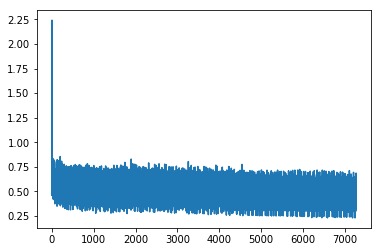

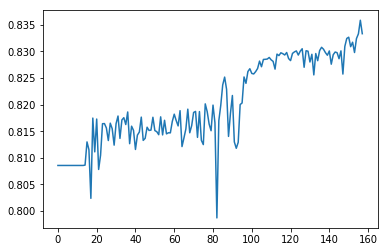

Epoch 158
[ 21.52692413]


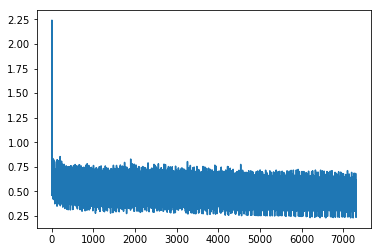

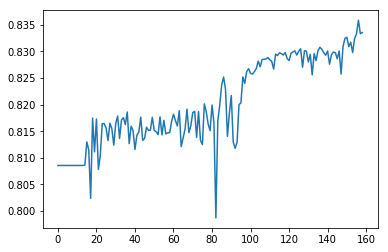

Epoch 159
[ 21.54227638]


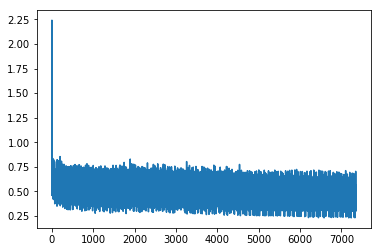

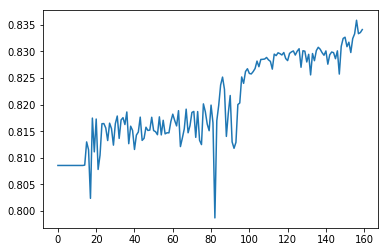

Epoch 160
[ 21.4243412]


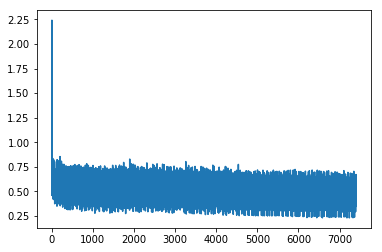

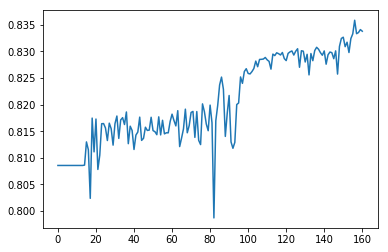

Epoch 161
[ 21.42035484]


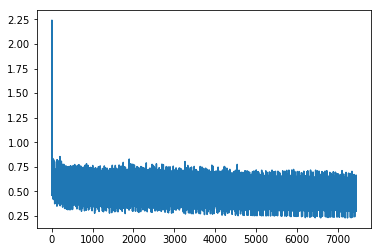

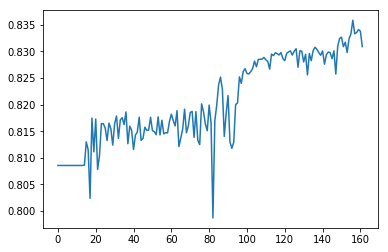

Epoch 162
[ 21.52984047]


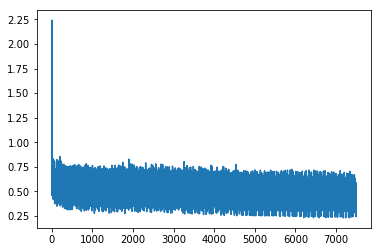

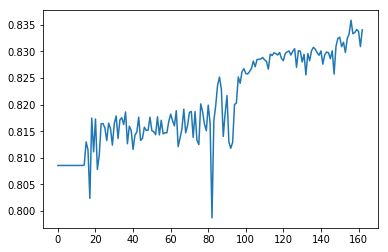

Epoch 163
[ 21.42391205]


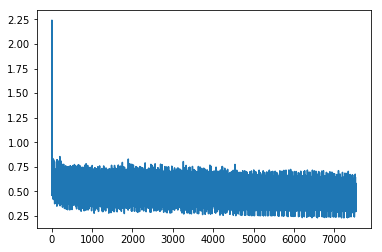

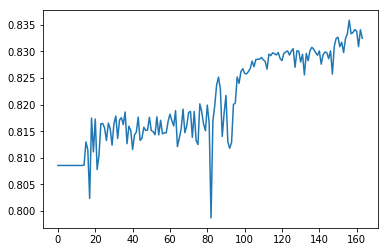

Epoch 164
[ 21.34178734]


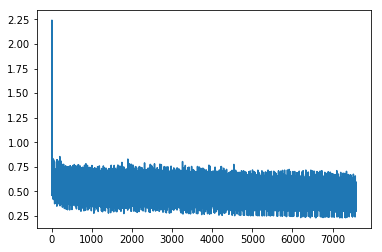

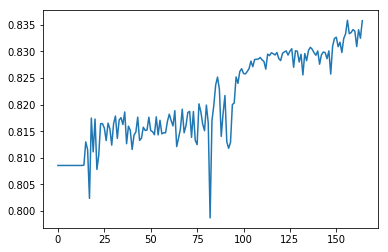

Epoch 165
[ 21.2688942]


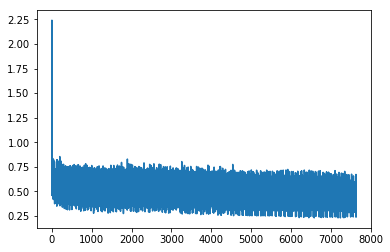

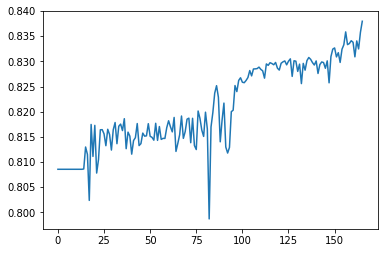

Epoch 166
[ 21.30830002]


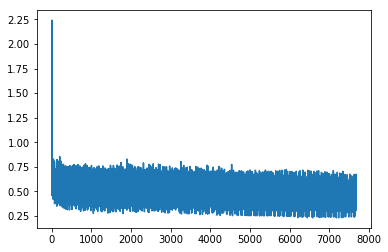

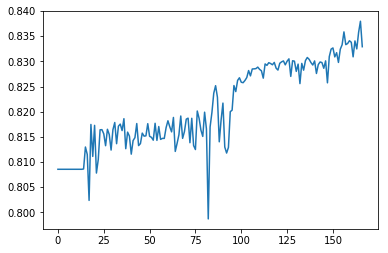

Epoch 167
[ 21.17408371]


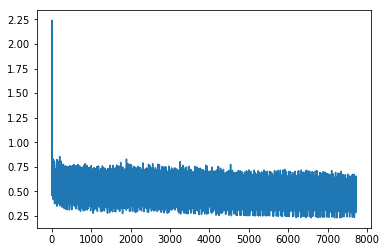

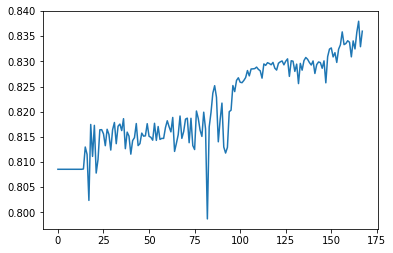

Epoch 168
[ 21.15993309]


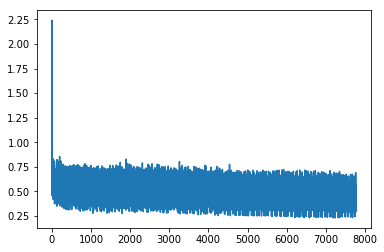

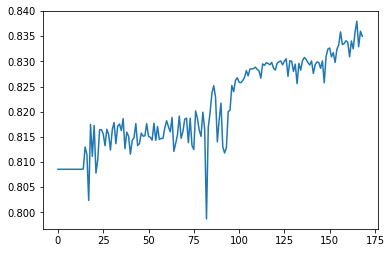

Epoch 169
[ 21.1754303]


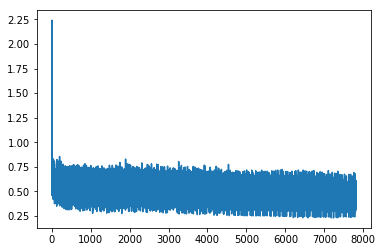

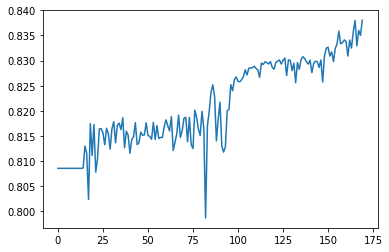

Epoch 170
[ 21.05138206]


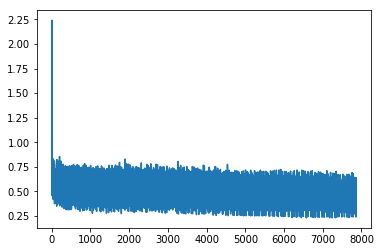

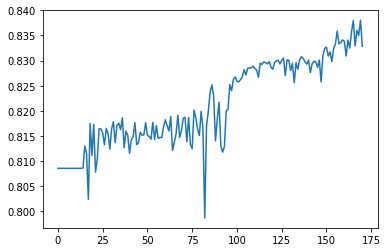

Epoch 171
[ 20.95750427]


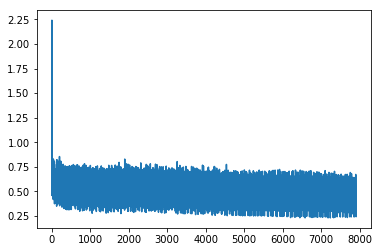

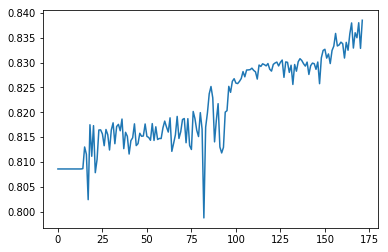

Epoch 172
[ 21.14328003]


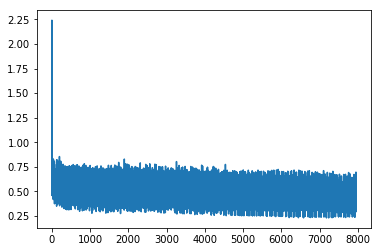

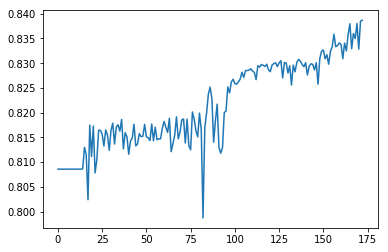

Epoch 173
[ 20.97156715]


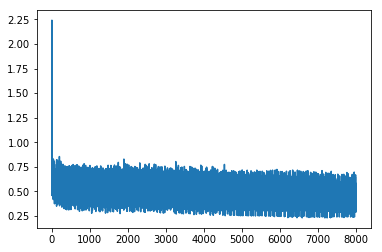

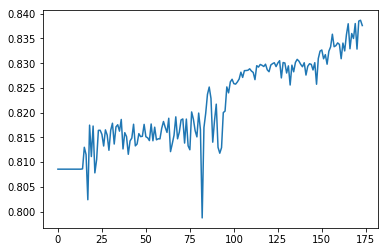

Epoch 174
[ 20.8711853]


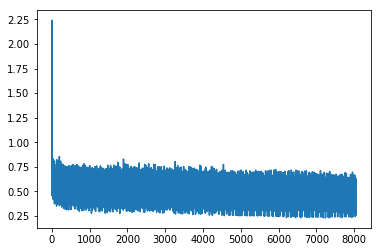

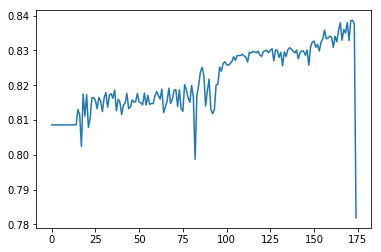

Epoch 175
[ 22.36367989]


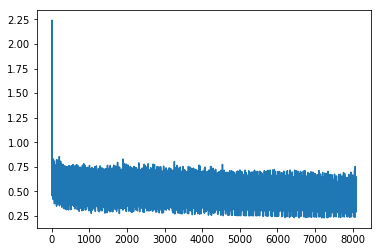

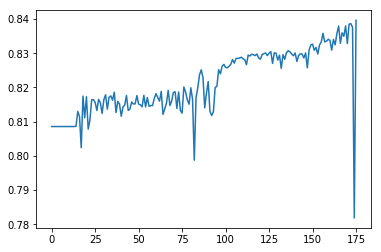

Epoch 176
[ 20.79638672]


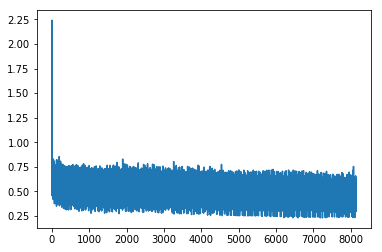

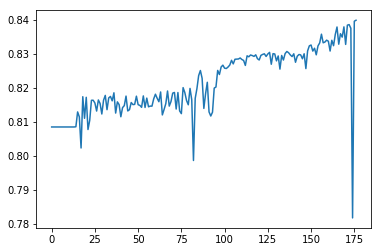

Epoch 177
[ 20.9120636]


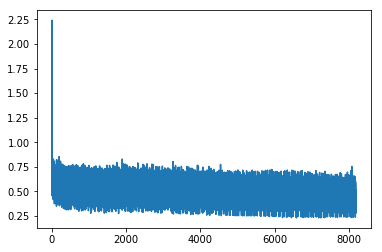

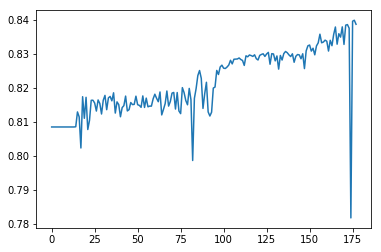

Epoch 178
[ 20.74552917]


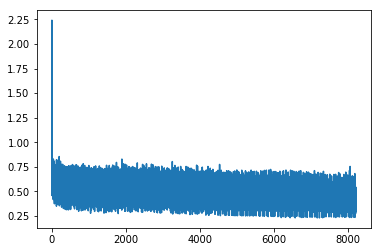

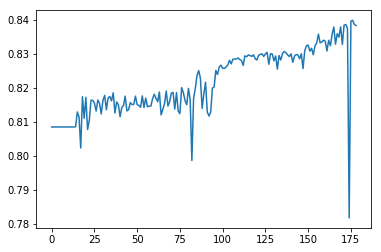

Epoch 179
[ 20.71614838]


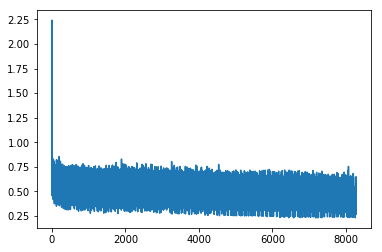

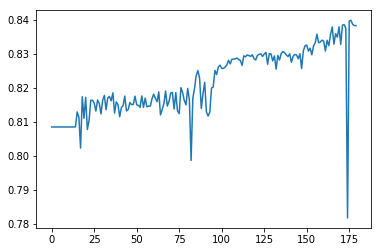

Epoch 180
[ 20.73896027]


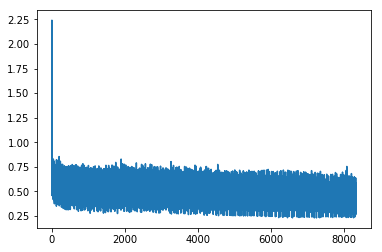

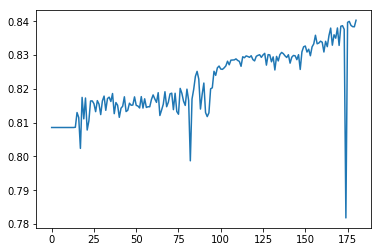

Epoch 181
[ 20.66750526]


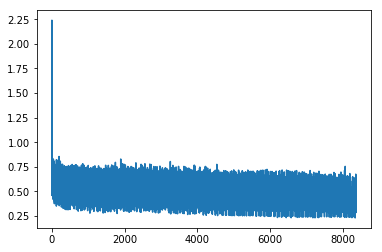

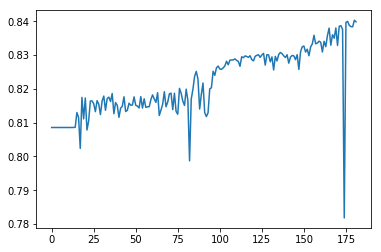

Epoch 182
[ 20.57244682]


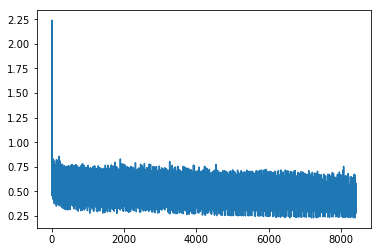

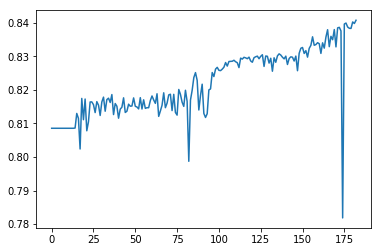

Epoch 183
[ 20.57335854]


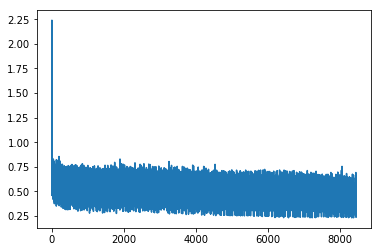

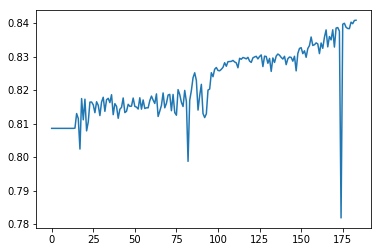

Epoch 184
[ 20.52350998]


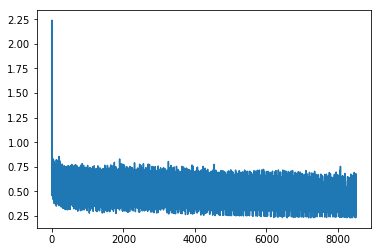

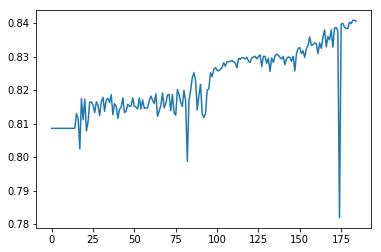

Epoch 185
[ 20.55545998]


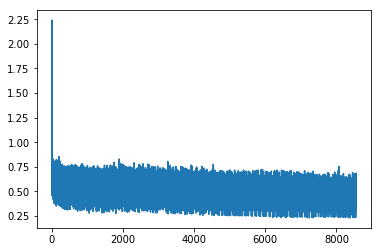

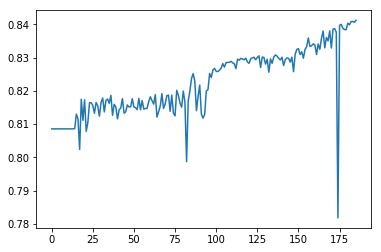

Epoch 186
[ 20.34211349]


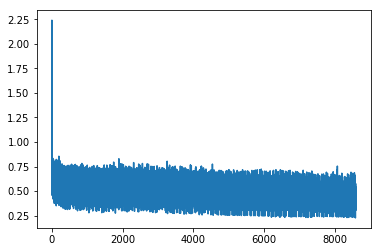

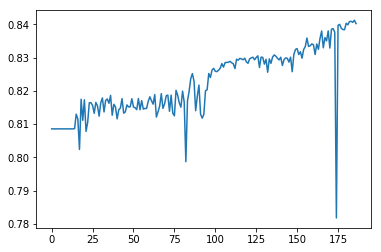

Epoch 187
[ 20.37159157]


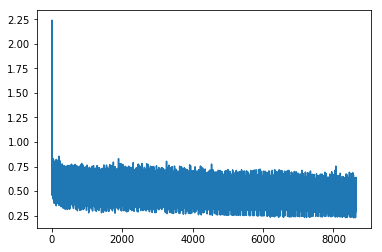

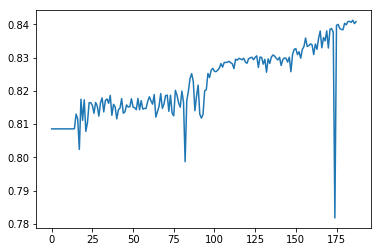

Epoch 188
[ 20.42818451]


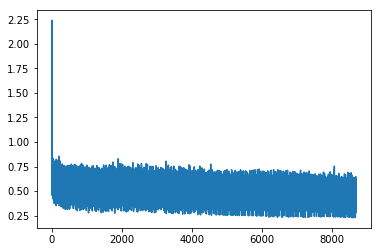

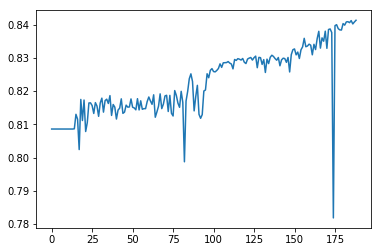

Epoch 189
[ 20.48962021]


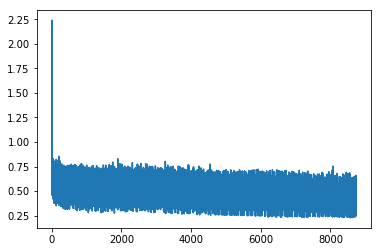

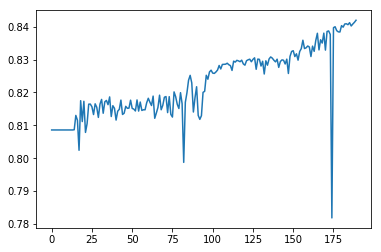

Epoch 190
[ 20.33334732]


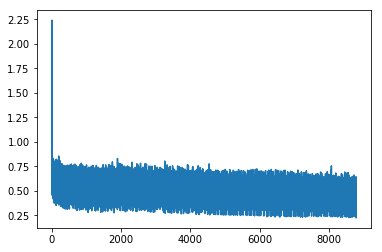

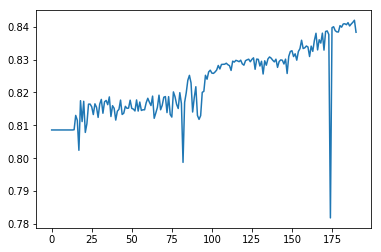

Epoch 191
[ 20.45041275]


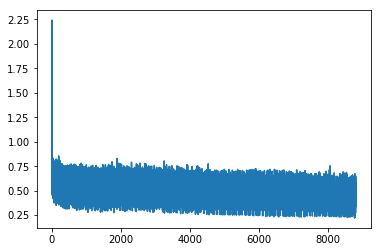

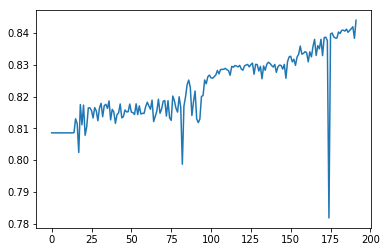

Epoch 192
[ 20.37159348]


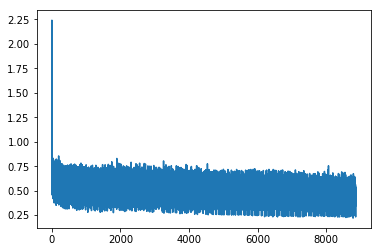

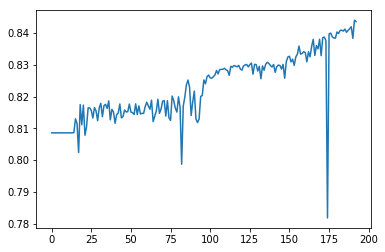

Epoch 193
[ 20.22616386]


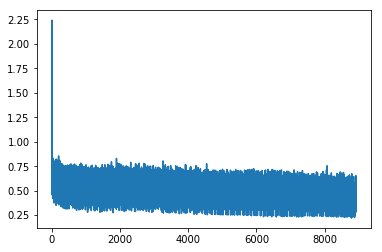

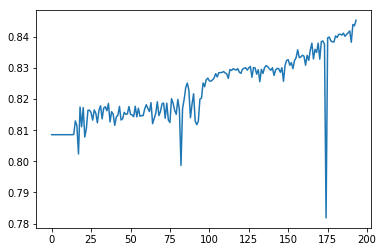

Epoch 194
[ 20.19021416]


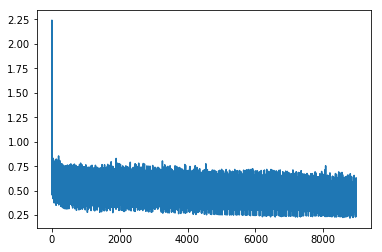

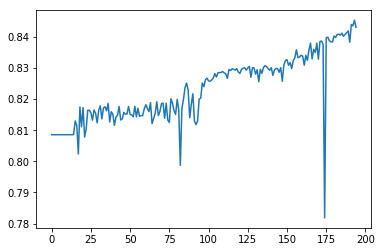

Epoch 195
[ 20.22839165]


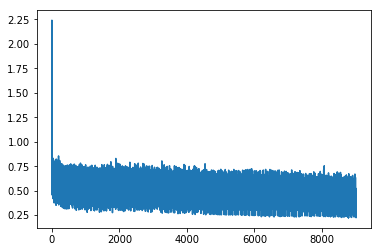

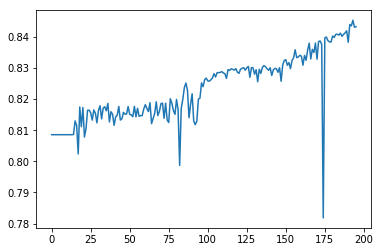

Epoch 196
[ 20.36014748]


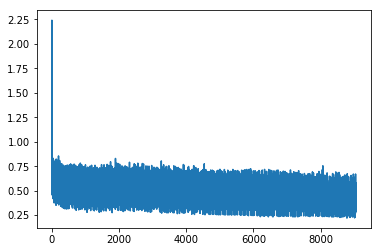

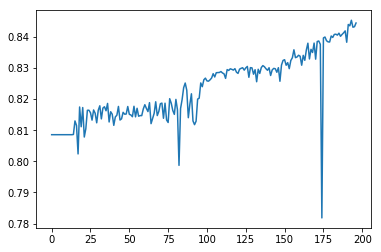

Epoch 197
[ 20.18545532]


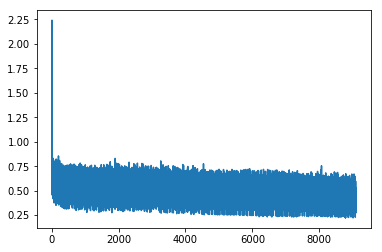

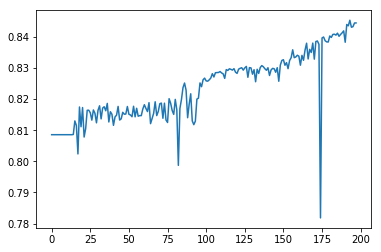

Epoch 198
[ 20.12481499]


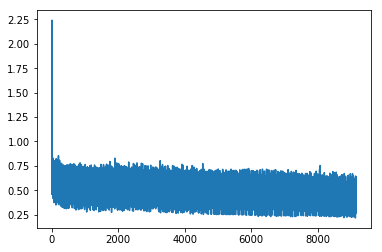

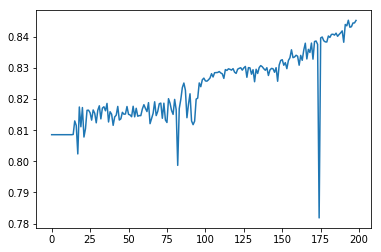

Epoch 199
[ 20.14987183]


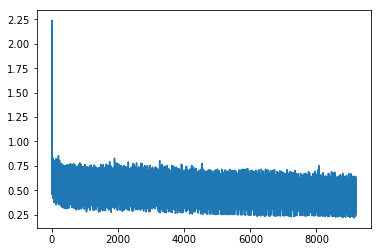

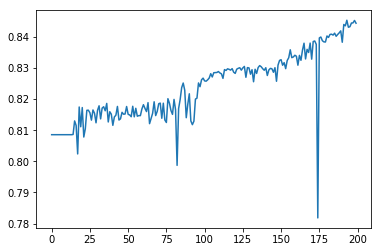

In [13]:
loss_list = np.array([])
long_loss_list = np.array([])
accuracy_list = np.array([])
model.train()
shuffleable = list(zip(inputs, targets))
for epoch in range(EPOCHS):  
    print("Epoch", epoch)
    this_epoch_loss = 0
    
    shuffle(shuffleable)
    
    for sequence, target in shuffleable:
    
        if SUBSEQ:
            non_zero_por = 0
            while non_zero_por < REQ_PORCENTAGE:
                start = random.randint(0,sequence.size()[0])
                length = random.randint(MIN_SUBSEQ, MAX_SUBSEQ)
                if(target.cpu().data.numpy()[start:start+length].size<MIN_SUBSEQ):
                    continue
                non_zero_por = np.sum(target[start:start+length].cpu().data.numpy()!=1) / target.cpu().data.numpy()[start:start+length].size  
            real_sequence = sequence[start:start+length]
            real_target = target[start:start+length]
        else:
            real_sequence = sequence
            real_target = target
        
        optimizer = exp_lr_scheduler(optimizer, epoch, init_lr=0.1)
          
        # Remember that Pytorch accumulates gradients.
        # We need to clear them out before each instance
        model.zero_grad()

        # Also, we need to clear out the hidden state of the LSTM,
        # detaching it from its history on the last instance.
        model.hidden = model.init_hidden()

        # Run our forward pass.
        tag_scores = model(real_sequence)

        # Compute the loss, gradients, and update the parameters by
        # calling optimizer.step()
        loss = loss_function(tag_scores, real_target)
        loss.backward()
        
        optimizer.step()
        
        this_epoch_loss += loss.cpu().data.numpy(0)
        
        long_loss_list = np.append(long_loss_list, loss.cpu().data.numpy(0))

    
    loss_list = np.append(loss_list, this_epoch_loss)
    print(this_epoch_loss)   
            
    base, accuracy = validation()
    accuracy_list = np.append(accuracy_list, accuracy)        
        
    t = np.arange(0., long_loss_list.size, 1)
    plt.plot(t, long_loss_list)
    
    plt.figure()
    t = np.arange(0., accuracy_list.size, 1)
    plt.plot(t, accuracy_list)

    plt.show()   
    

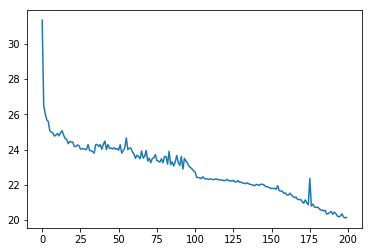

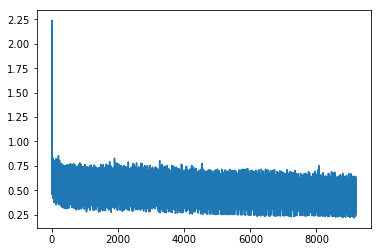

In [14]:
t = np.arange(0., EPOCHS, 1)
    
plt.plot(t, loss_list)

t = np.arange(0., long_loss_list.size, 1)
plt.figure()
plt.plot(t, long_loss_list)

Total non-zero 13832


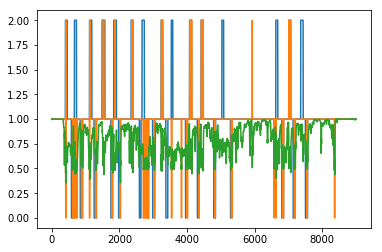

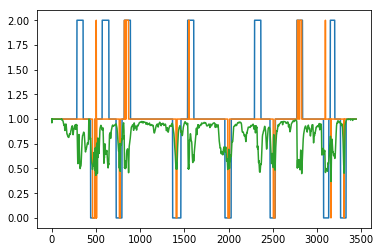

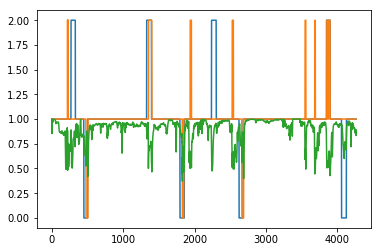

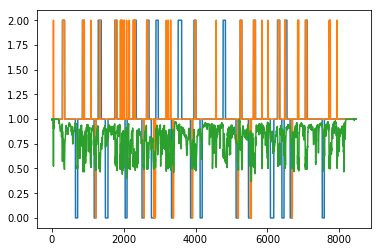

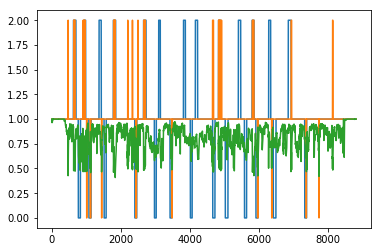

...

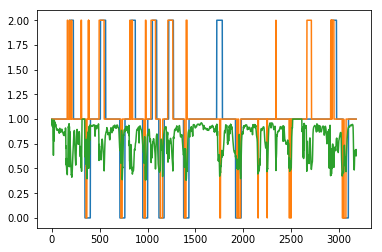

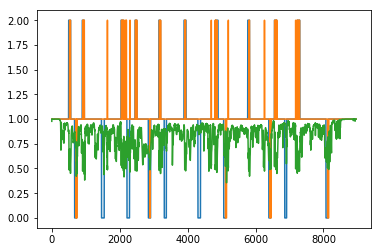

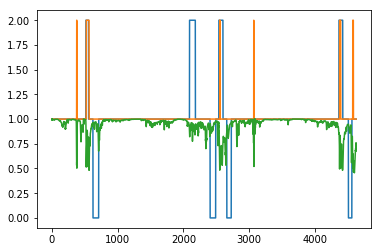

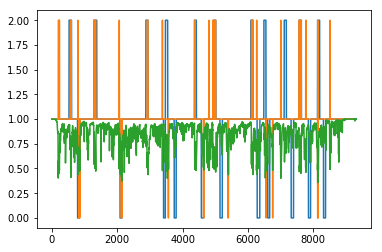

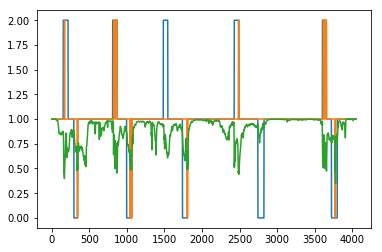

In [15]:
model.eval()

total_non_zero = 0

for sequence, target in list(zip(inputs,targets)):
    model.hidden = model.init_hidden()
    
    tag_scores = model(sequence)

    
    values, indices = tag_scores.max(1)
    
    scores_np = tag_scores.cpu().data.numpy()
    indices_np = indices.cpu().data.numpy()
    probs = values.cpu().data.numpy()
    
    total_non_zero += (indices.cpu().data.numpy() != 1).sum()    
    
    t = np.arange(0., indices_np.size, 1)
    plt.figure()
    plt.plot(t, target.cpu().data.numpy(), t, indices.cpu().data.numpy(), t, np.exp(probs))
    
print("Total non-zero", total_non_zero)
    

Base accuracy 0.808574598751
Final accuracy 0.844403158384


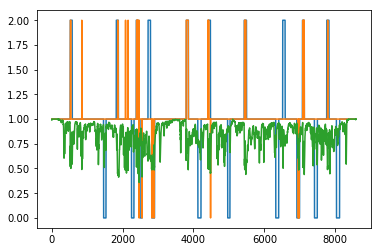

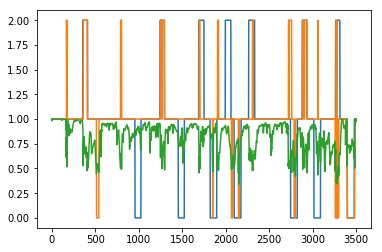

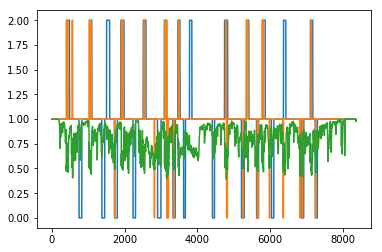

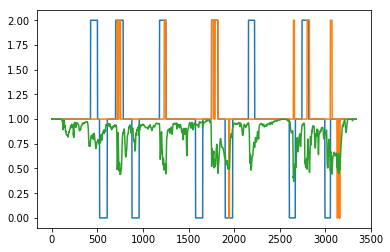

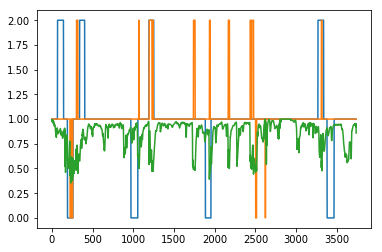

...

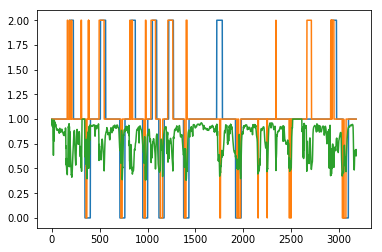

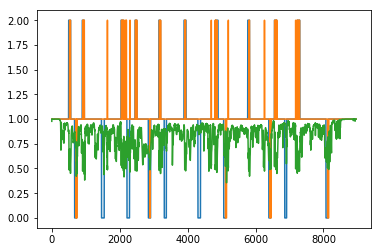

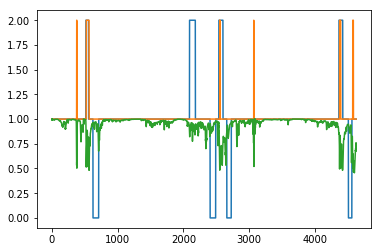

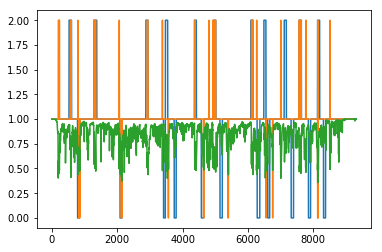

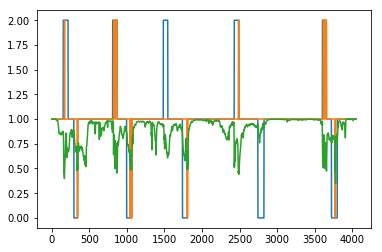

In [16]:
base, final = validation(True)
print("Base accuracy", base)
print("Final accuracy", final)

In [20]:
test_df = pd.read_csv('../input_data/test.csv')

def prepare_test_inputs(db):
    chunk_list = []
    
    for chunk in range(db['Chunk_Id'].min(), db['Chunk_Id'].max()+1):                
        db_slice = db[db['Chunk_Id']==chunk]
        data_slice = db_slice.as_matrix()
        tensor_slice = torch.Tensor(data_slice[:,2:])        
        chunk_list.append(autograd.Variable(tensor_slice, requires_grad=True).cuda())
                         
    return chunk_list


test_input = prepare_test_inputs(test_df)

model.eval()
import csv

alltogether = np.empty((0), dtype=np.float32)

for sequence in test_input:
        
    model.hidden = model.init_hidden()

    val_scores = model(sequence)
    val_values, val_indices = val_scores.max(1)

    scores_np = val_scores.cpu().data.numpy()
    indices_np = val_indices.cpu().data.numpy()
    probs = val_values.cpu().data.numpy()
    
    alltogether=np.hstack((alltogether, indices_np))
    
with open('../submissions/test_1.csv', 'w') as csvfile:
    writer = csv.writer(csvfile, delimiter=',',
                                quotechar='|', quoting=csv.QUOTE_MINIMAL)
    writer.writerow(['\'Id\'','\'Category\''])
    idx_2 = 0
    for idx in range(260416, 334591):
        writer.writerow(['\''+str(idx)+'\'', '\''+str(int(alltogether[idx_2]-1))+'\''])
        idx_2 += 1


### 